# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

In [6]:
class Identity(nn.Module):
    def forward(self, x):
        return x

### ResNet18-LSTM

In [7]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        resnet18.fc = Identity()
        
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder
        self.cnn = resnet18
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [8]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        resnet50.fc = Identity()
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet50
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [9]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        resnet101.fc = Identity()
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = resnet101
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [10]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet121.classifier.in_features
        
        densenet121.classifier = Identity()

        ### CNN Encoder
        self.cnn = densenet121
        
        for param in densenet121.parameters():
            param.requires_grad = False
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
       
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [11]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet169.classifier.in_features
        
        densenet169.classifier = Identity()
        
        for param in densenet169.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet169
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [12]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = densenet201.classifier.in_features
        
        densenet201.classifier = Identity()
        
        for param in densenet201.parameters():
            param.requires_grad = False

        ### CNN Encoder
        self.cnn = densenet201
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [13]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
        vgg11bn.classifier[6] = Identity()
        
        for param in vgg11bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [14]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        vgg16bn.classifier[6] = Identity()
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [15]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        vgg19bn.classifier[6] = Identity()
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

            
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [16]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [17]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(model.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModels_10folds/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 700, Number of Layers = 1, Dropout = 0.5

In [18]:
resnet18LSTM_700_1_50 = ResNet18_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
resnet50LSTM_700_1_50 = ResNet50_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
resnet101LSTM_700_1_50 = ResNet101_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

densenet121LSTM_700_1_50 = DenseNet121_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
densenet169LSTM_700_1_50 = DenseNet169_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
densenet201LSTM_700_1_50 = DenseNet201_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

vgg11bnLSTM_700_1_50 = VGG11_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
vgg16bnLSTM_700_1_50 = VGG16_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)
vgg19bnLSTM_700_1_50 = VGG19_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0.5)

# 
# 

## Train Models

In [19]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0151 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.069 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0483 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1468 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1407 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0451 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0367 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

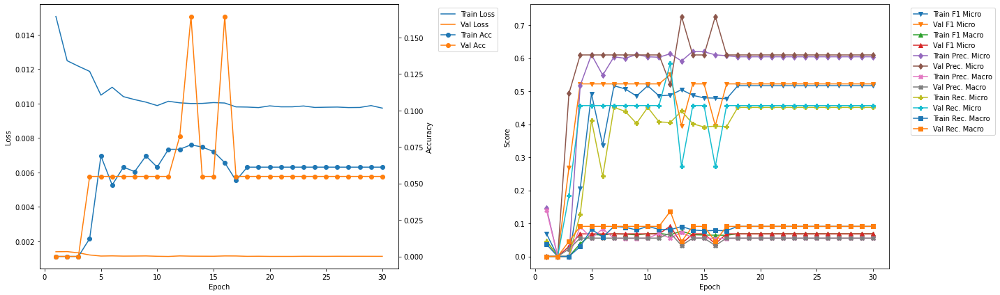

-------------------------------------------
FOLD 2
-------------------------------------------
Validation F1 Micro Score Increased (0.550725 --> 0.553073).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 3.95
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4649 	Validation F1 Micro: 0.5531
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0732
Train Precision Mirco: 0.6048 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.3775 	Validation Recall Micro: 0.467
Train Recall Marco: 0.0751 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.08
Train Loss: 0.0121 	Validation Loss: 0.0012
Train Accuracy: 0.0275 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.2985 	Validation F1 Micro: 0.5531
Train F1 Marco: 0.0568 	Validation F1 Macro: 0.0732
Train Precision Mirco: 0.5069 	Validation Precision Micro: 0.6781
Train Precisi

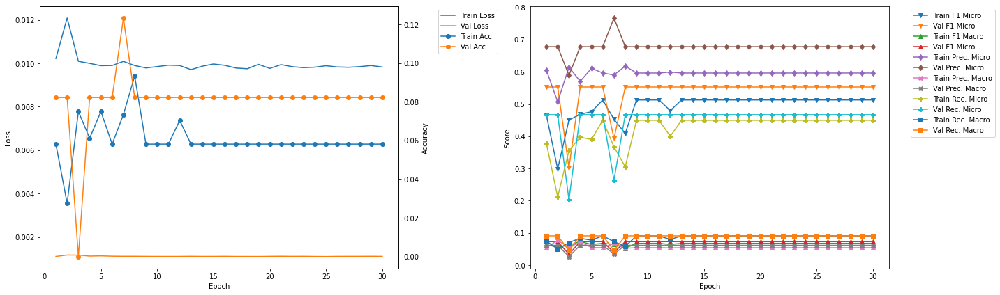

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 7.73
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0489 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5079 	Validation F1 Micro: 0.4522
Train F1 Marco: 0.0744 	Validation F1 Macro: 0.0633
Train Precision Mirco: 0.5943 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0721 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4434 	Validation Recall Micro: 0.392
Train Recall Marco: 0.0896 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.86
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4908 	Validation F1 Micro: 0.4522
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0633
Train Precision Mirco: 0.624 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0558 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4045 	

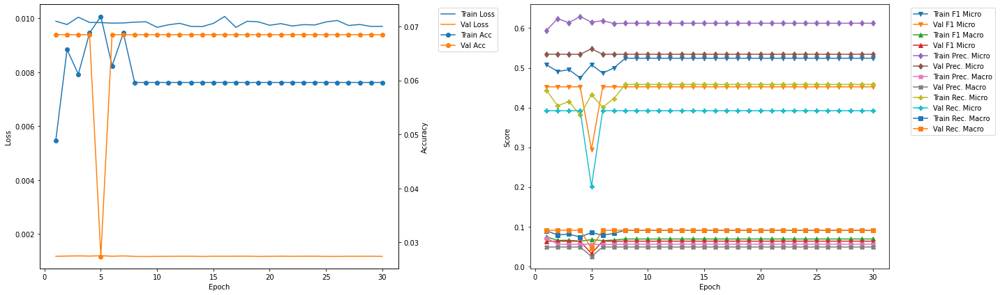

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.51
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4781 	Validation F1 Micro: 0.5382
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6117 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3924 	Validation Recall Micro: 0.4862
Train Recall Marco: 0.0783 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.63
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.052 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4619 	Validation F1 Micro: 0.5382
Train F1 Marco: 0.0621 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3726 	V

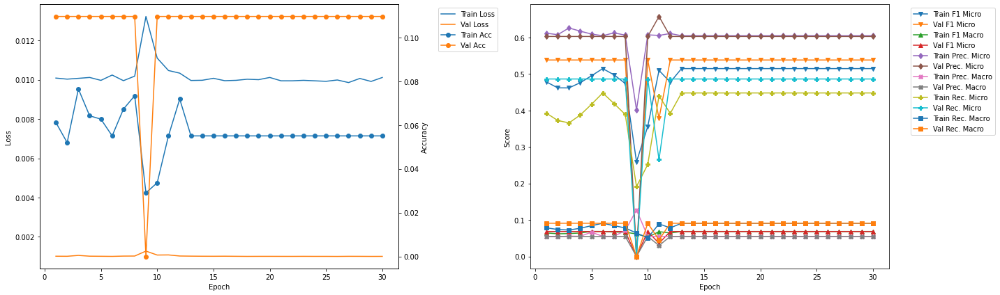

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.28
Train Loss: 0.0103 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4929 	Validation F1 Micro: 0.4824
Train F1 Marco: 0.072 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.5898 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.073 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4233 	Validation Recall Micro: 0.4227
Train Recall Marco: 0.0854 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.41
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4933 	Validation F1 Micro: 0.4824
Train F1 Marco: 0.0659 	Validation F1 Macro: 0.0654
Train Precision Mirco: 0.62 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0511
Train Recall Mirco: 0.4096 	

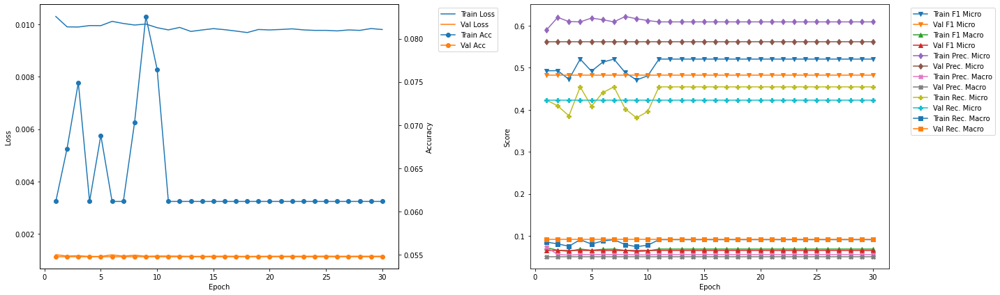

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.06
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0673 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4944 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6128 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4143 	Validation Recall Micro: 0.4365
Train Recall Marco: 0.0822 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.19
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.518 	Validation F1 Micro: 0.3556
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.452 	Va

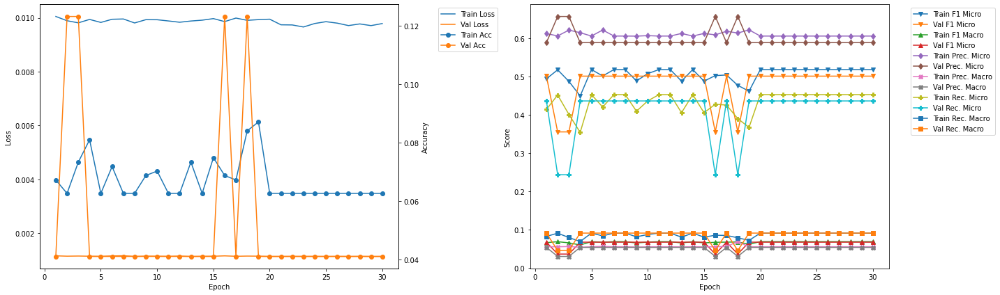

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.84
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4894 	Validation F1 Micro: 0.4955
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.6005 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0585 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.413 	Validation Recall Micro: 0.4392
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 22.97
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4903 	Validation F1 Micro: 0.4955
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0658
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.5685
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0517
Train Recall Mirco: 0.4101

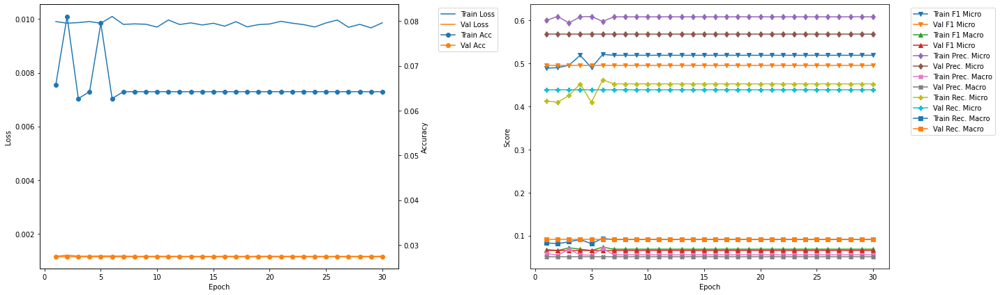

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.62
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0718 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4565 	Validation F1 Micro: 0.5373
Train F1 Marco: 0.0614 	Validation F1 Macro: 0.0695
Train Precision Mirco: 0.6155 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.3628 	Validation Recall Micro: 0.4712
Train Recall Marco: 0.0715 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.75
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0641 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5147 	Validation F1 Micro: 0.5373
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0695
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4493 	

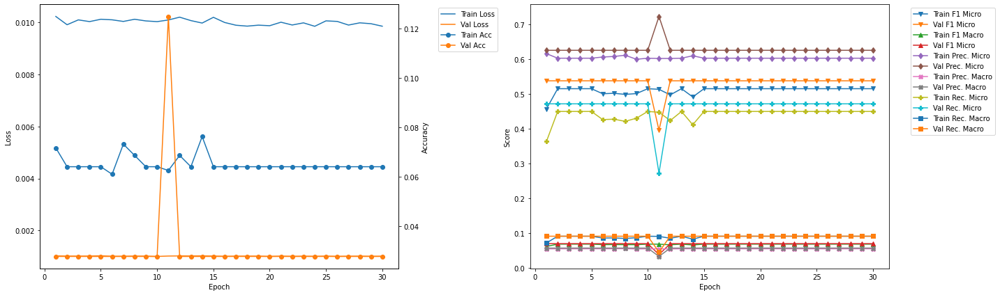

-------------------------------------------
FOLD 9
-------------------------------------------
Validation F1 Micro Score Increased (0.553073 --> 0.563050).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 30.41
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5008 	Validation F1 Micro: 0.563
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0726
Train Precision Mirco: 0.5914 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0564 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4343 	Validation Recall Micro: 0.4873
Train Recall Marco: 0.0885 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.53
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4919 	Validation F1 Micro: 0.563
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0726
Train Precision Mirco: 0.6017 	Validation Precision Micro: 0.6667
Train Precisio

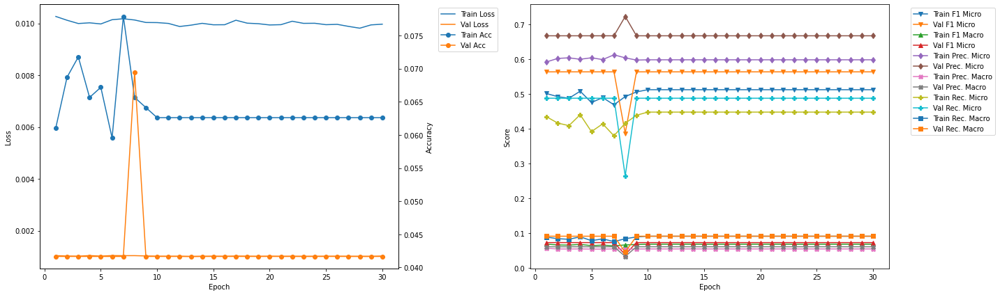

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.19
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4884 	Validation F1 Micro: 0.5238
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.5983 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0723 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4125 	Validation Recall Micro: 0.4583
Train Recall Marco: 0.0828 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.31
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4932 	Validation F1 Micro: 0.5238
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4131 	V

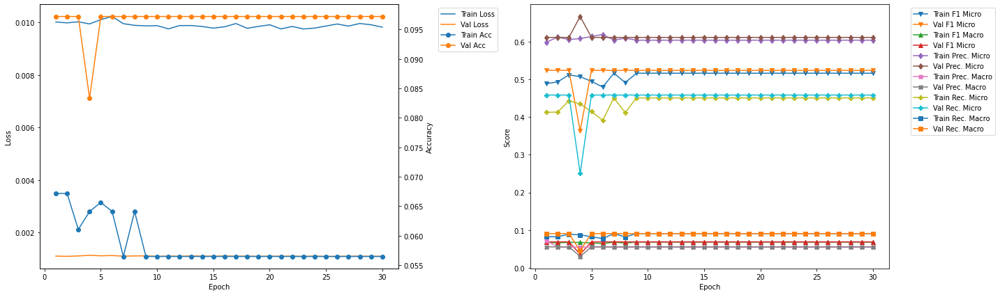

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 1
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0611 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5008 	Validation F1 Micro: 0.563
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0726
Train Precision Mirco: 0.5914 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0564 	Validation Precision Macro: 0.0606
Train Recall Mirco: 0.4343 	Validation Recall Micro: 0.4873
Train Recall Marco: 0.0885 	Validation Recall Macro: 0.0909


In [20]:
resnet18LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet18LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.0202 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0988 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0697 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1174 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1281 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0852 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0701 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0138 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

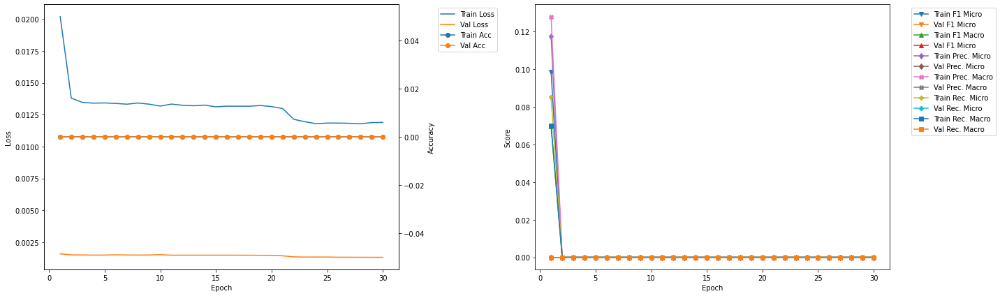

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.38
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.52
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

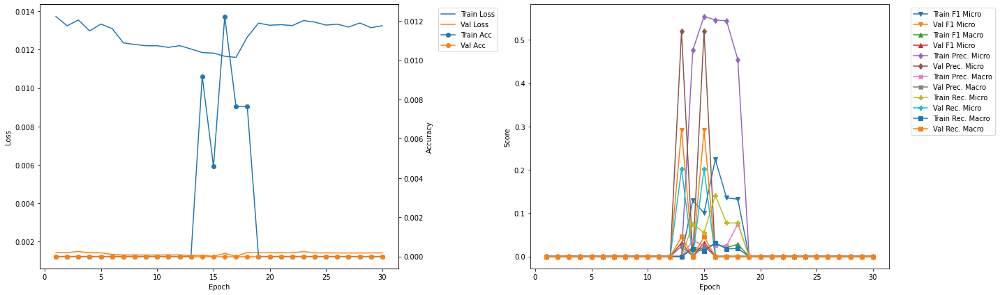

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.64
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.78
Train Loss: 0.0131 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

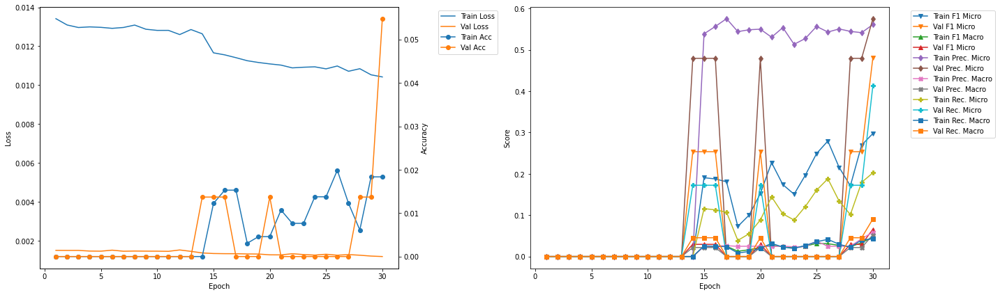

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.481375 --> 0.495677).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 12.89
Train Loss: 0.0104 	Validation Loss: 0.0012
Train Accuracy: 0.0489 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3458 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0557 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.5712 	Validation Precision Micro: 0.589
Train Precision Marco: 0.078 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.248 	Validation Recall Micro: 0.4279
Train Recall Marco: 0.052 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.03
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.468 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6113 	Validation Precision Micro: 0.589
Train Precision Ma

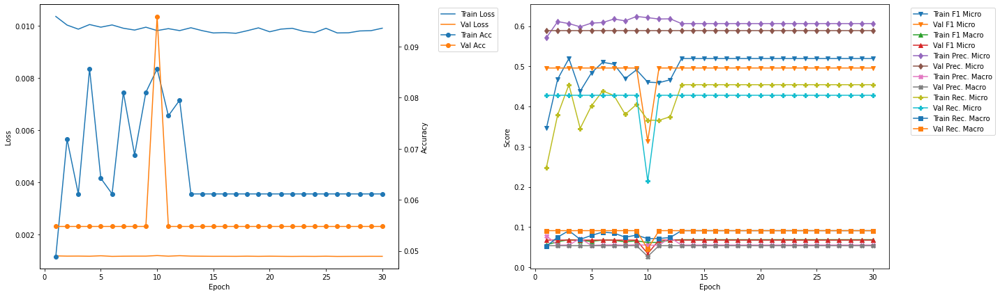

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.14
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0581 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5033 	Validation F1 Micro: 0.4657
Train F1 Marco: 0.0716 	Validation F1 Macro: 0.063
Train Precision Mirco: 0.6033 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0708 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4317 	Validation Recall Micro: 0.4127
Train Recall Marco: 0.0865 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.29
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4709 	Validation F1 Micro: 0.4657
Train F1 Marco: 0.0631 	Validation F1 Macro: 0.063
Train Precision Mirco: 0.6267 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.3771 	Val

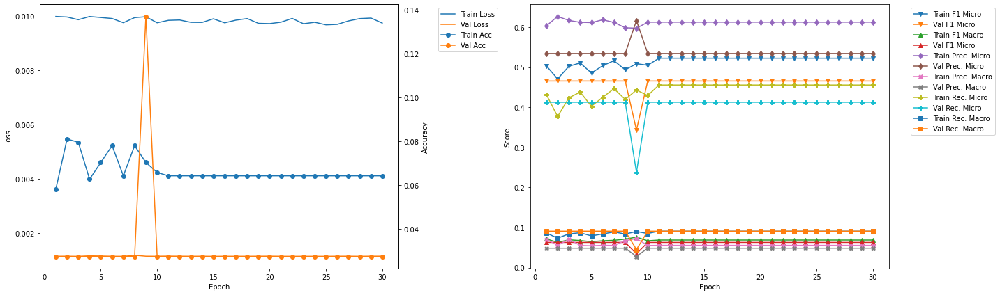

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.4
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4659 	Validation F1 Micro: 0.3453
Train F1 Marco: 0.0672 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.6005 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0811 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.3806 	Validation Recall Micro: 0.2341
Train Recall Marco: 0.0766 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.495677 --> 0.529915).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.54
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0826 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4604 	Validation F1 Micro: 0.5299
Train F1 Marco: 0.0713 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.5921 	Validation Precision Micro: 0.637
Train Precision M

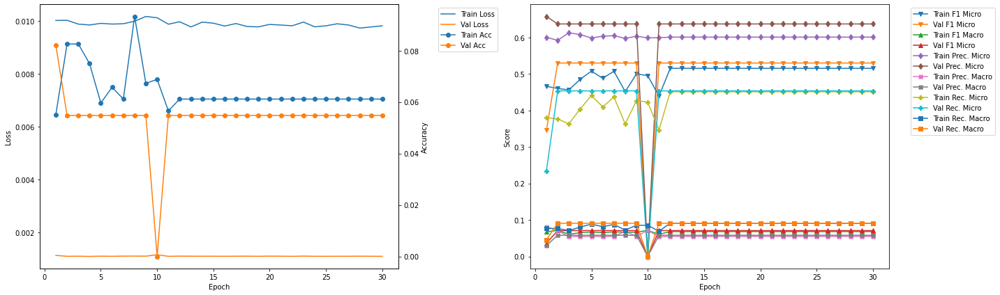

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.529915 --> 0.572254).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 25.66
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0948 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4611 	Validation F1 Micro: 0.5723
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.0732
Train Precision Mirco: 0.5861 	Validation Precision Micro: 0.6781
Train Precision Marco: 0.0704 	Validation Precision Macro: 0.0616
Train Recall Mirco: 0.3801 	Validation Recall Micro: 0.495
Train Recall Marco: 0.0777 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.8
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5106 	Validation F1 Micro: 0.5723
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0732
Train Precision Mirco: 0.5963 	Validation Precision Micro: 0.6781
Train Precis

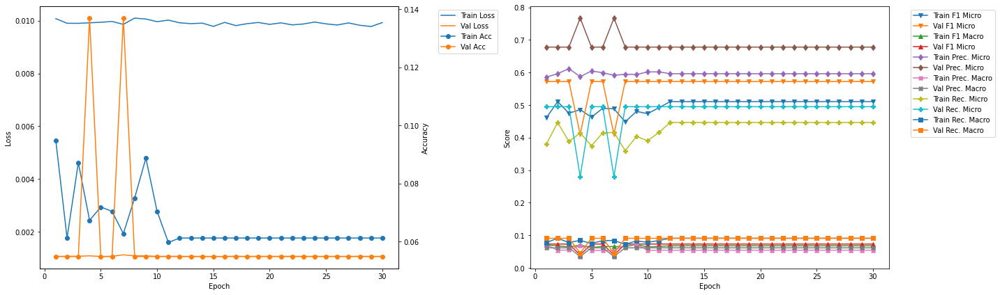

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.9
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0672 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4997 	Validation F1 Micro: 0.5519
Train F1 Marco: 0.0697 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.5976 	Validation Precision Micro: 0.6458
Train Precision Marco: 0.0725 	Validation Precision Macro: 0.0587
Train Recall Mirco: 0.4293 	Validation Recall Micro: 0.4819
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.05
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.1528
Train F1 Mirco: 0.5023 	Validation F1 Micro: 0.4
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0385
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.7361
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0335
Train Recall Mirco: 0.4316 	Valid

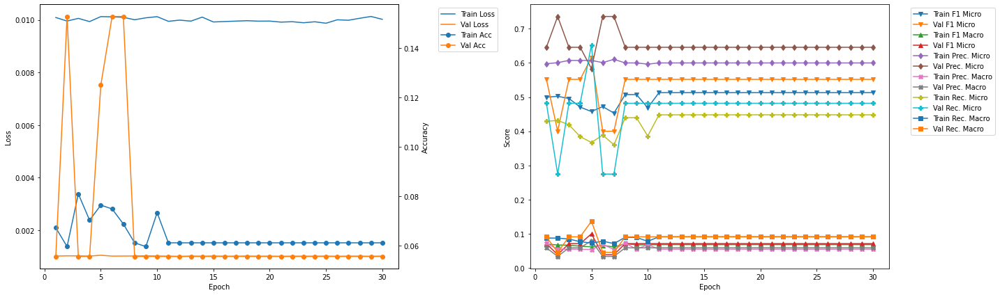

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.16
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0855 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4925 	Validation F1 Micro: 0.4817
Train F1 Marco: 0.068 	Validation F1 Macro: 0.0644
Train Precision Mirco: 0.6127 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.0683 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.4118 	Validation Recall Micro: 0.4293
Train Recall Marco: 0.0818 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.3
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4919 	Validation F1 Micro: 0.4817
Train F1 Marco: 0.0655 	Validation F1 Macro: 0.0644
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.4112 	Va

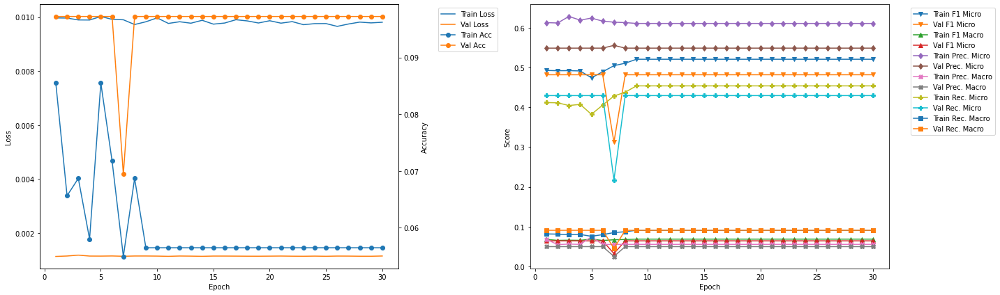

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.4
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0626 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4791 	Validation F1 Micro: 0.541
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0725 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.3973 	Validation Recall Micro: 0.4811
Train Recall Marco: 0.0799 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.54
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.51 	Validation F1 Micro: 0.541
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0692
Train Precision Mirco: 0.6047 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.441 	Va

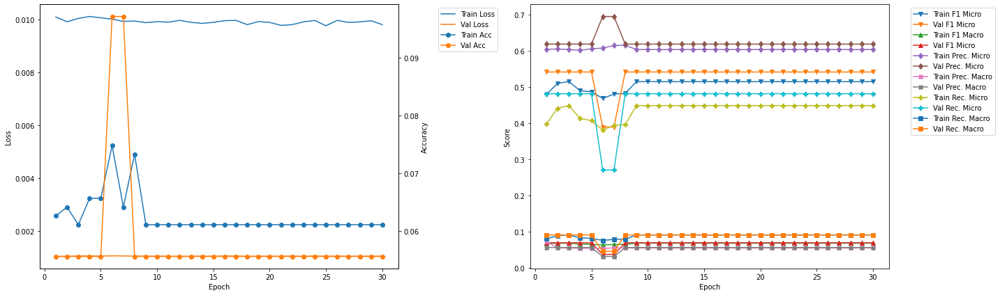

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 5
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4577 	Validation F1 Micro: 0.6161
Train F1 Marco: 0.0615 	Validation F1 Macro: 0.0996
Train Precision Mirco: 0.6075 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0538 	Validation Precision Macro: 0.0795
Train Recall Mirco: 0.3672 	Validation Recall Micro: 0.6528
Train Recall Marco: 0.0727 	Validation Recall Macro: 0.1364


In [21]:
resnet50LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet50LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0199 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0909 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0412 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1597 	Validation Precision Micro: 0.0
Train Precision Marco: 0.115 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0635 	Validation Recall Micro: 0.0
Train Recall Marco: 0.035 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

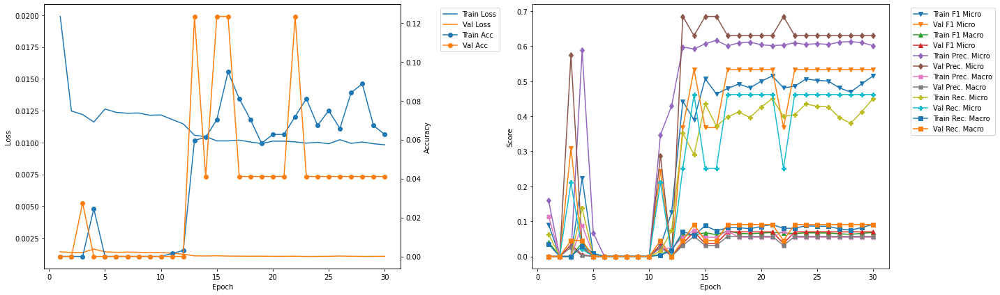

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.98
Train Loss: 0.0099 	Validation Loss: 0.0013
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5114 	Validation F1 Micro: 0.4709
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0669
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4452 	Validation Recall Micro: 0.3953
Train Recall Marco: 0.0885 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.14
Train Loss: 0.0098 	Validation Loss: 0.0013
Train Accuracy: 0.0917 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4708 	Validation F1 Micro: 0.4709
Train F1 Marco: 0.0628 	Validation F1 Macro: 0.0669
Train Precision Mirco: 0.6399 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0568 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.3724

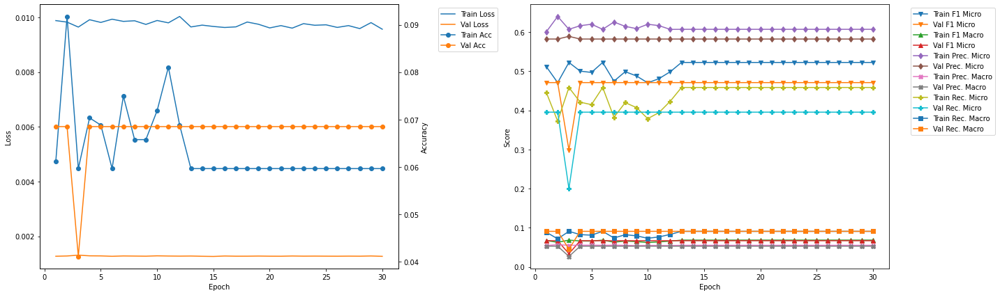

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.78
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4971 	Validation F1 Micro: 0.5301
Train F1 Marco: 0.0666 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6109 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.4191 	Validation Recall Micro: 0.4731
Train Recall Marco: 0.0841 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.466 	Validation F1 Micro: 0.5301
Train F1 Marco: 0.063 	Validation F1 Macro: 0.0682
Train Precision Mirco: 0.6302 	Validation Precision Micro: 0.6027
Train Precision Marco: 0.0561 	Validation Precision Macro: 0.0548
Train Recall Mirco: 0.3697 	Vali

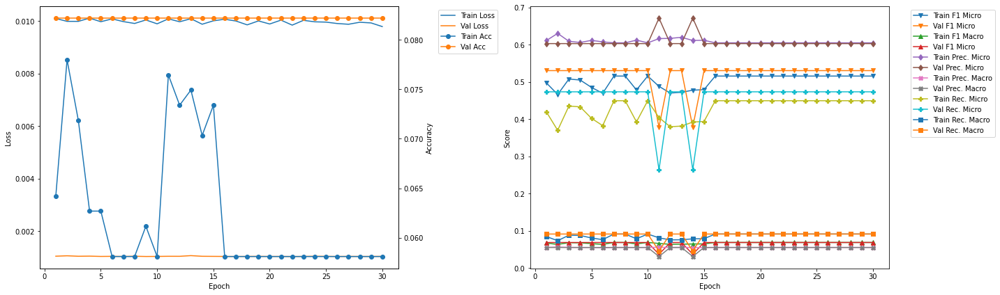

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.533333 --> 0.551084).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 14.59
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.081 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4903 	Validation F1 Micro: 0.5511
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.409 	Validation Recall Micro: 0.5028
Train Recall Marco: 0.0824 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.75
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5133 	Validation F1 Micro: 0.5511
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0687
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marc

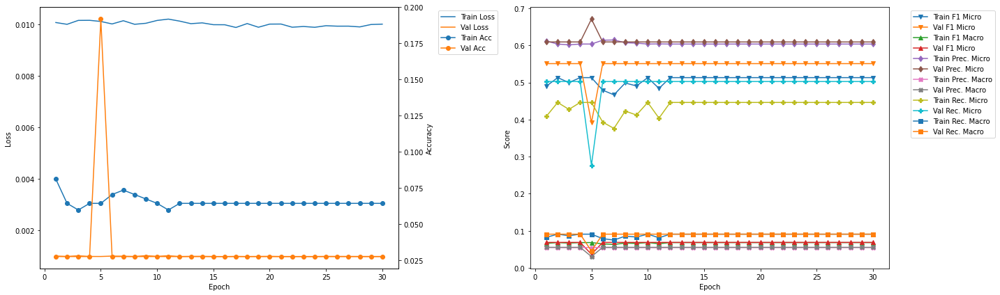

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.4
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0765 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4659 	Validation F1 Micro: 0.4818
Train F1 Marco: 0.062 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6244 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3715 	Validation Recall Micro: 0.4076
Train Recall Marco: 0.0719 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.56
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4983 	Validation F1 Micro: 0.3169
Train F1 Marco: 0.0722 	Validation F1 Macro: 0.0347
Train Precision Mirco: 0.5941 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0689 	Validation Precision Macro: 0.028
Train Recall Mirco: 0.4291 	Va

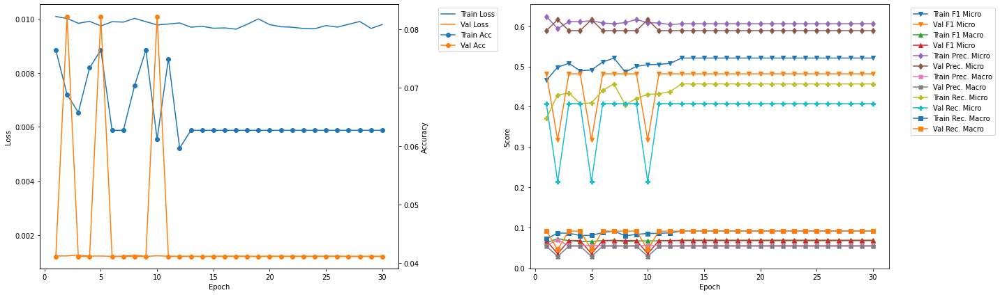

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.21
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5063 	Validation F1 Micro: 0.5275
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0691
Train Precision Mirco: 0.6049 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4354 	Validation Recall Micro: 0.4573
Train Recall Marco: 0.0875 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.37
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.5107 	Validation F1 Micro: 0.4044
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0391
Train Precision Mirco: 0.6044 	Validation Precision Micro: 0.7534
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0342
Train Recall Mirco: 0.4422 	

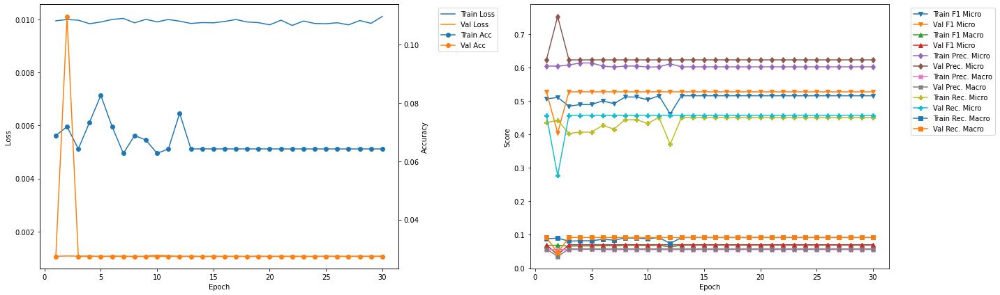

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.551084 --> 0.561194).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 29.02
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.5612
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.5978 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4278 	Validation Recall Micro: 0.4974
Train Recall Marco: 0.0866 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.18
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4815 	Validation F1 Micro: 0.5612
Train F1 Marco: 0.0647 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.6062 	Validation Precision Micro: 0.6438
Train Precision

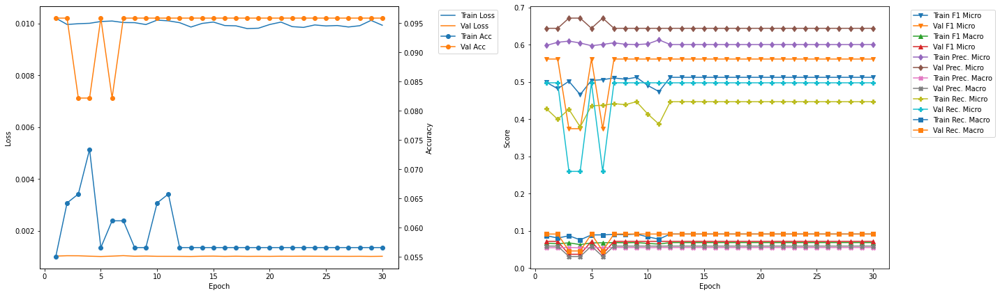

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 33.83
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4953 	Validation F1 Micro: 0.5217
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0695
Train Precision Mirco: 0.605 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0568
Train Recall Mirco: 0.4192 	Validation Recall Micro: 0.4478
Train Recall Marco: 0.0836 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.99
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0595 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.381
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0381
Train Precision Mirco: 0.6023 	Validation Precision Micro: 0.7222
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0328
Train Recall Mirco: 0.4519 	Va

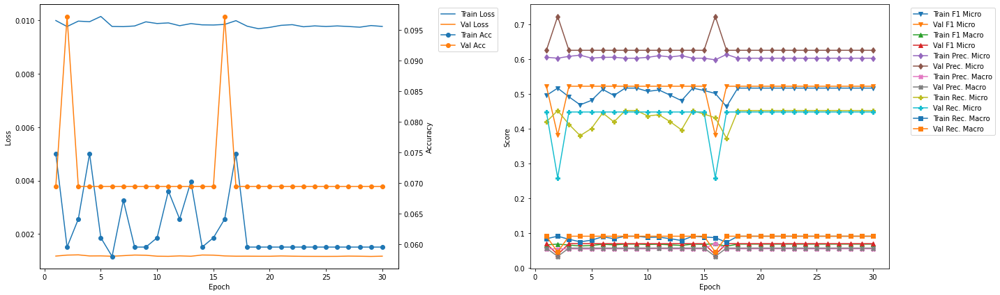

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.63
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5012 	Validation F1 Micro: 0.4847
Train F1 Marco: 0.07 	Validation F1 Macro: 0.0641
Train Precision Mirco: 0.6016 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.0607 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.4295 	Validation Recall Micro: 0.4341
Train Recall Marco: 0.0873 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.79
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5053 	Validation F1 Micro: 0.4847
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0641
Train Precision Mirco: 0.6138 	Validation Precision Micro: 0.5486
Train Precision Marco: 0.0555 	Validation Precision Macro: 0.0499
Train Recall Mirco: 0.4295

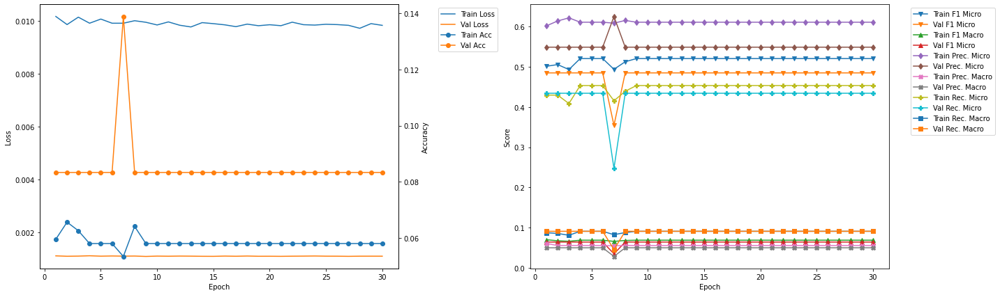

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.44
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5096 	Validation F1 Micro: 0.512
Train F1 Marco: 0.0709 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.5969 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0605 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4446 	Validation Recall Micro: 0.4521
Train Recall Marco: 0.0911 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.6
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4871 	Validation F1 Micro: 0.512
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0672
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4076 

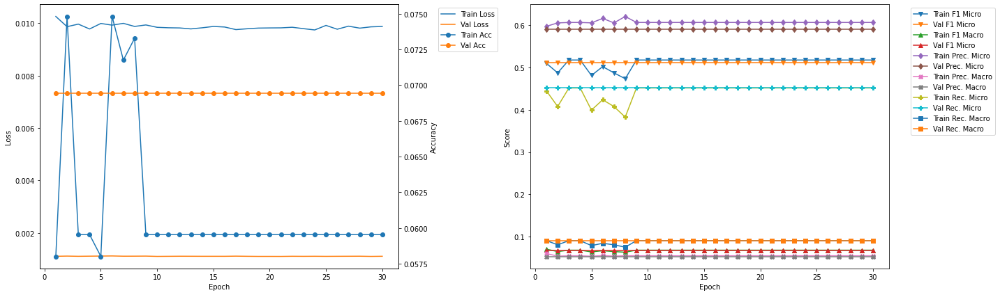

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 7 	Epoch: 1
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.055 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4987 	Validation F1 Micro: 0.5612
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0712
Train Precision Mirco: 0.5978 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0541 	Validation Precision Macro: 0.0585
Train Recall Mirco: 0.4278 	Validation Recall Micro: 0.4974
Train Recall Marco: 0.0866 	Validation Recall Macro: 0.0909


In [22]:
resnet101LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = resnet101LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.15
Train Loss: 0.0282 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1309 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0805 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1304 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1188 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1313 	Validation Recall Micro: 0.0
Train Recall Marco: 0.112 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.29
Train Loss: 0.0125 	Validation Loss: 0.0012
Train Accuracy: 0.0107 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0753 	Validation F1 Micro: 0.0
Train F1 Marco: 0.014 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4675 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0515 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0409 	Validation Recall Micro: 0.0
Train Reca

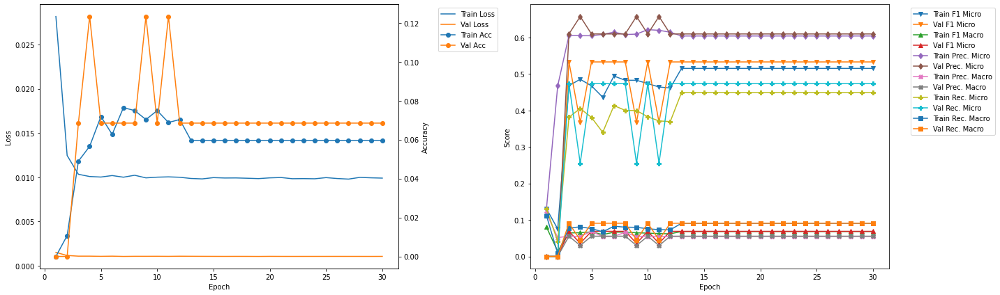

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.47
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1222 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0255 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3846 	Validation Precision Micro: 0.0
Train Precision Marco: 0.053 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0726 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0287 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.61
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0413 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3739 	Validation F1 Micro: 0.3545
Train F1 Marco: 0.0541 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.5871 	Validation Precision Micro: 0.726
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.033
Train Recall Mirco: 0.2743 	Validation Recall Micr

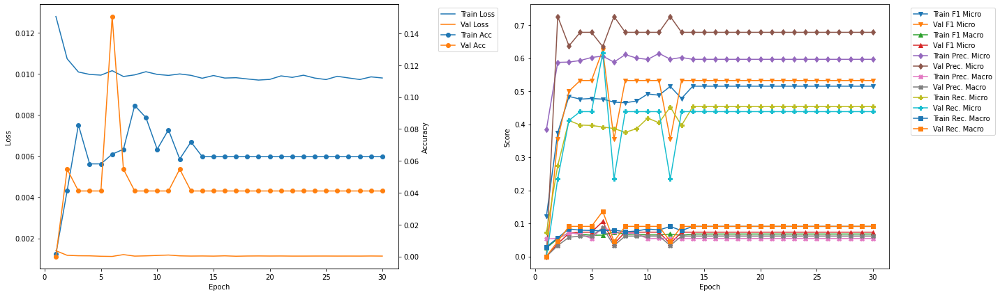

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.79
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0245 	Validation Accuracy: 0.0
Train F1 Mirco: 0.137 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0275 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4747 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0609 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.08 	Validation Recall Micro: 0.0
Train Recall Marco: 0.018 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.94
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1087 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0196 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.48 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0515 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0613 	Validation Recall Micro: 0.0
Train Recal

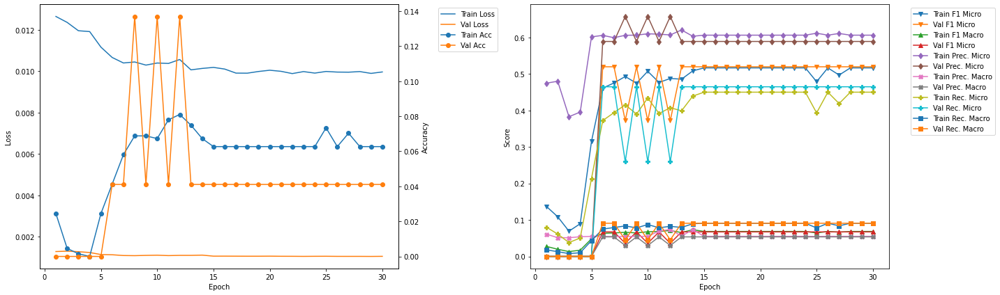

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 13.11
Train Loss: 0.0105 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4794 	Validation F1 Micro: 0.5133
Train F1 Marco: 0.0735 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0797 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.3979 	Validation Recall Micro: 0.4508
Train Recall Marco: 0.0821 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.25
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.491 	Validation F1 Micro: 0.5133
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.411

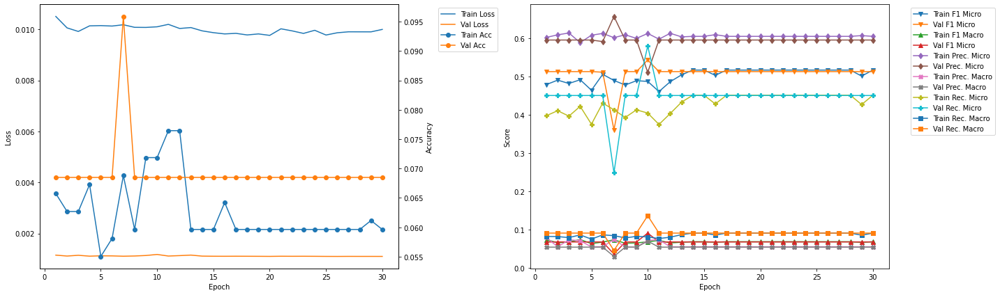

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.43
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4776 	Validation F1 Micro: 0.35
Train F1 Marco: 0.0733 	Validation F1 Macro: 0.0365
Train Precision Mirco: 0.5912 	Validation Precision Micro: 0.6712
Train Precision Marco: 0.0705 	Validation Precision Macro: 0.0305
Train Recall Mirco: 0.4006 	Validation Recall Micro: 0.2367
Train Recall Marco: 0.0818 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.57
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4817 	Validation F1 Micro: 0.5269
Train F1 Marco: 0.0758 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.5739 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0698 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4149 

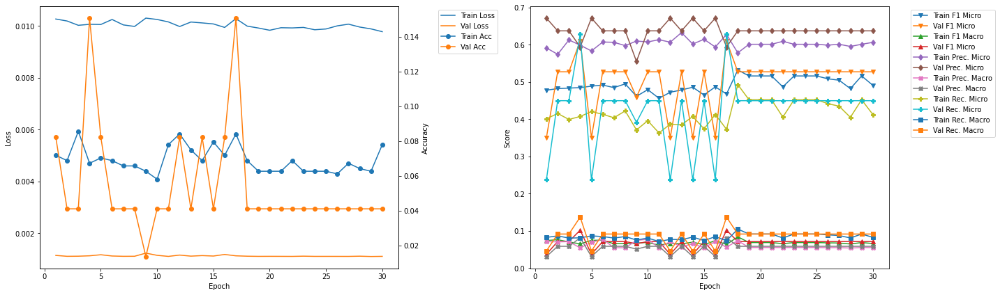

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.75
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.081 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4798 	Validation F1 Micro: 0.5341
Train F1 Marco: 0.0747 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.074 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3981 	Validation Recall Micro: 0.4712
Train Recall Marco: 0.0817 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.89
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5272 	Validation F1 Micro: 0.5341
Train F1 Marco: 0.0797 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.5923 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0753 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.4749 	

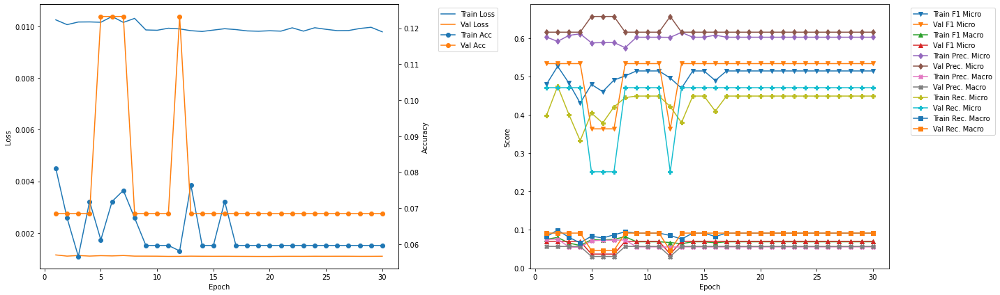

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.06
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.078 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4814 	Validation F1 Micro: 0.3835
Train F1 Marco: 0.0707 	Validation F1 Macro: 0.0374
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.6986
Train Precision Marco: 0.0756 	Validation Precision Macro: 0.0318
Train Recall Mirco: 0.3991 	Validation Recall Micro: 0.2642
Train Recall Marco: 0.0807 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.21
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.466 	Validation F1 Micro: 0.5825
Train F1 Marco: 0.0626 	Validation F1 Macro: 0.0956
Train Precision Mirco: 0.6103 	Validation Precision Micro: 0.5479
Train Precision Marco: 0.0542 	Validation Precision Macro: 0.0747
Train Recall Mirco: 0.3769

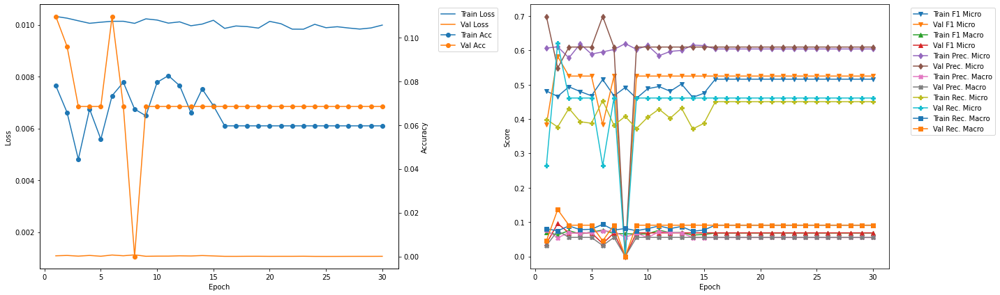

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.38
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0855 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5021 	Validation F1 Micro: 0.4684
Train F1 Marco: 0.076 	Validation F1 Macro: 0.0616
Train Precision Mirco: 0.6048 	Validation Precision Micro: 0.5139
Train Precision Marco: 0.074 	Validation Precision Macro: 0.0467
Train Recall Mirco: 0.4293 	Validation Recall Micro: 0.4302
Train Recall Marco: 0.0874 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.52
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4998 	Validation F1 Micro: 0.4897
Train F1 Marco: 0.0673 	Validation F1 Macro: 0.0822
Train Precision Mirco: 0.6227 	Validation Precision Micro: 0.4398
Train Precision Marco: 0.0653 	Validation Precision Macro: 0.06
Train Recall Mirco: 0.4175 	Val

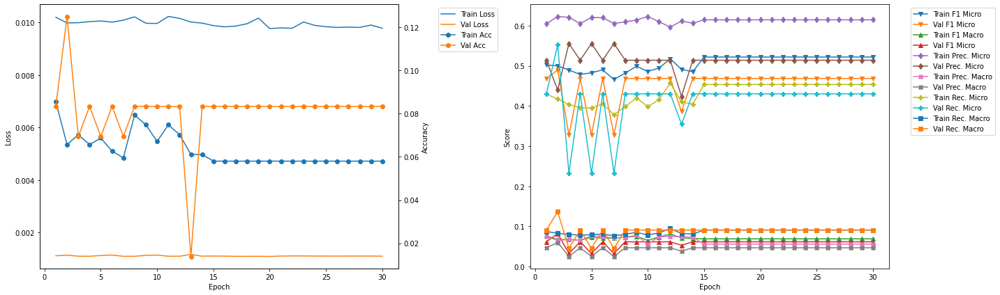

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.7
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4492 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0653 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6039 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0709 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.3576 	Validation Recall Micro: 0.4322
Train Recall Marco: 0.071 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.84
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0656 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4959 	Validation F1 Micro: 0.5015
Train F1 Marco: 0.0761 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.5852 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0719 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4302 	

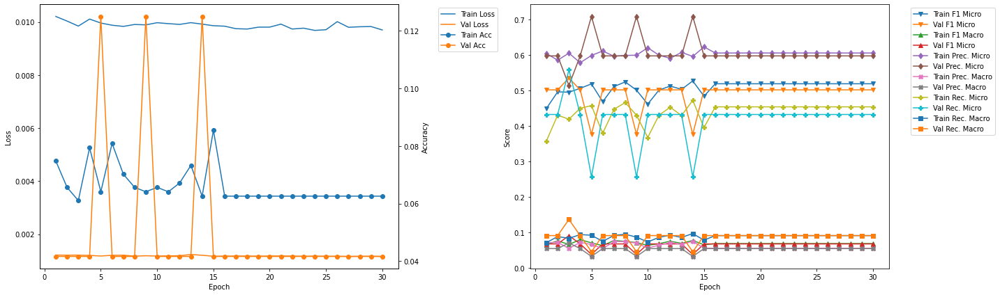

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.02
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4859 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0696 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4071 	Validation Recall Micro: 0.4456
Train Recall Marco: 0.0817 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.16
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0748 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5048 	Validation F1 Micro: 0.5104
Train F1 Marco: 0.076 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.5969 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0723 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4373

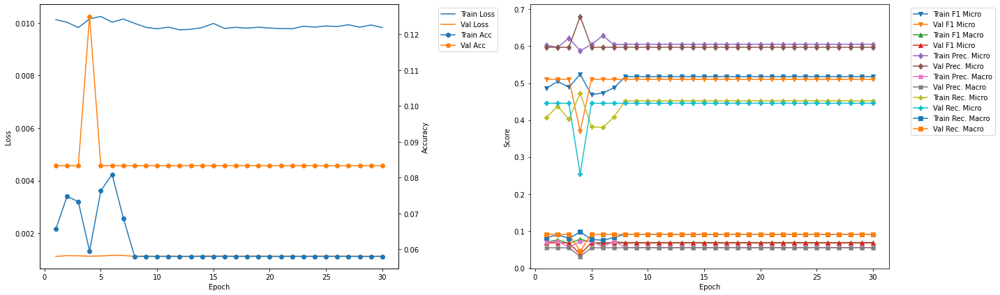

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 6
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4758 	Validation F1 Micro: 0.6247
Train F1 Marco: 0.0644 	Validation F1 Macro: 0.1056
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.6347
Train Precision Marco: 0.088 	Validation Precision Macro: 0.0866
Train Recall Mirco: 0.3916 	Validation Recall Micro: 0.615
Train Recall Marco: 0.0772 	Validation Recall Macro: 0.1364


In [23]:
densenet121LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet121LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0201 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0727 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0424 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1264 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1141 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.051 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0382 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

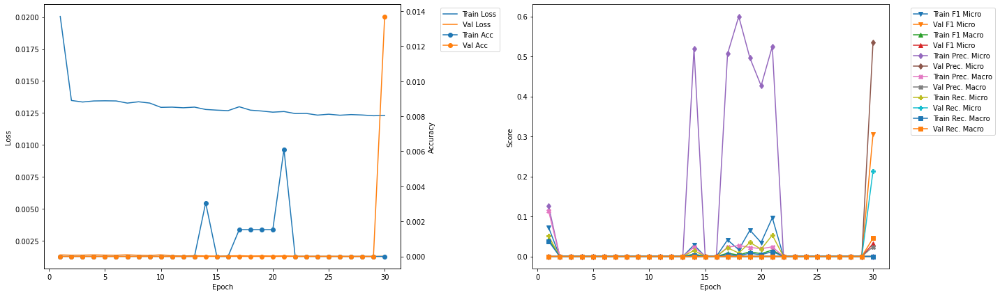

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.79
Train Loss: 0.0138 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0141 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0038 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.13 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0236 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0075 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0022 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.94
Train Loss: 0.0129 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

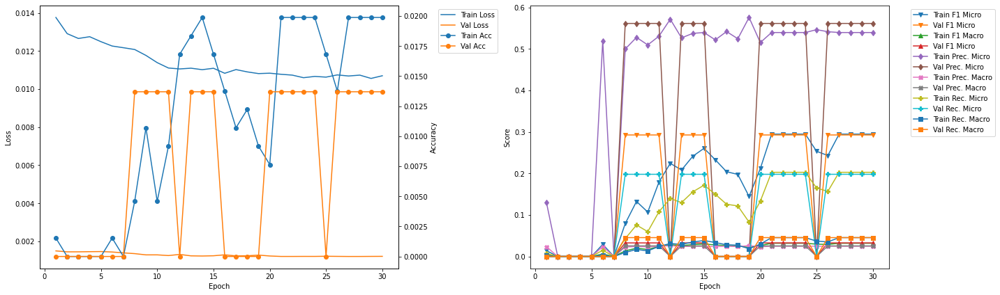

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.42
Train Loss: 0.0111 	Validation Loss: 0.0012
Train Accuracy: 0.0107 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2117 	Validation F1 Micro: 0.2846
Train F1 Marco: 0.0305 	Validation F1 Macro: 0.0306
Train Precision Mirco: 0.4948 	Validation Precision Micro: 0.5068
Train Precision Marco: 0.0591 	Validation Precision Macro: 0.023
Train Recall Mirco: 0.1347 	Validation Recall Micro: 0.1979
Train Recall Marco: 0.0302 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.58
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0199 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2958 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0321 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5459 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0248 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.2028 	Validation Rec

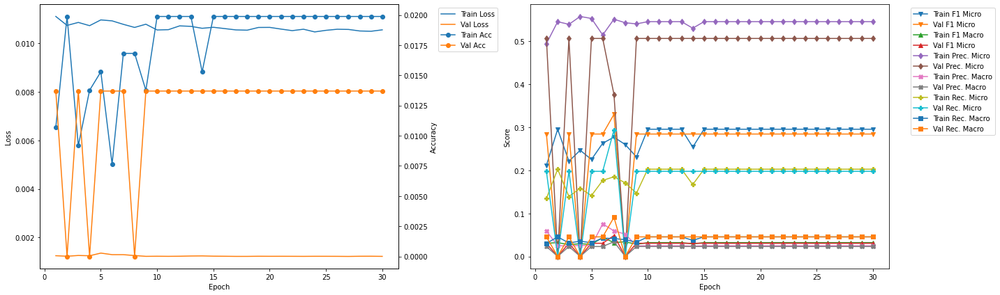

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.06
Train Loss: 0.0113 	Validation Loss: 0.0012
Train Accuracy: 0.0138 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2153 	Validation F1 Micro: 0.2921
Train F1 Marco: 0.0389 	Validation F1 Macro: 0.0317
Train Precision Mirco: 0.4821 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0702 	Validation Precision Macro: 0.0243
Train Recall Mirco: 0.1386 	Validation Recall Micro: 0.201
Train Recall Marco: 0.0339 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.21
Train Loss: 0.0107 	Validation Loss: 0.0012
Train Accuracy: 0.0092 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.2108 	Validation F1 Micro: 0.2921
Train F1 Marco: 0.0267 	Validation F1 Macro: 0.0317
Train Precision Mirco: 0.5361 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0244 	Validation Precision Macro: 0.0243
Train Recall Mirco: 0.131

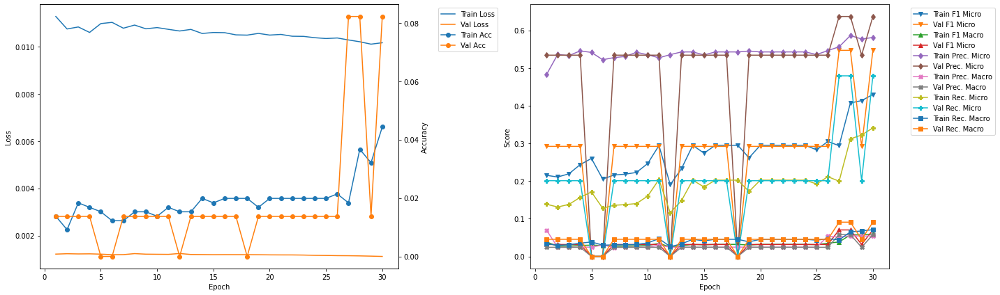

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.69
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1457 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0289 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4677 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0766 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0863 	Validation Recall Micro: 0.0
Train Recall Marco: 0.021 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.85
Train Loss: 0.0117 	Validation Loss: 0.0013
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0909 	Validation F1 Micro: 0.0
Train F1 Marco: 0.015 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5029 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0229 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.05 	Validation Recall Micro: 0.0
Train R

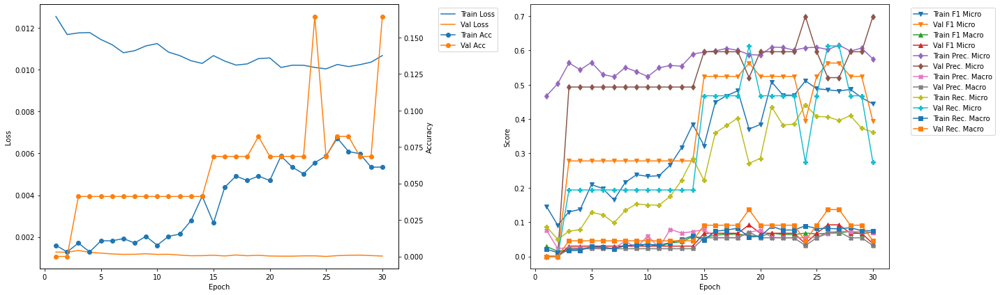

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.33
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4293 	Validation F1 Micro: 0.5044
Train F1 Marco: 0.0706 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.5972 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0741 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.335 	Validation Recall Micro: 0.441
Train Recall Marco: 0.0697 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.48
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4596 	Validation F1 Micro: 0.5044
Train F1 Marco: 0.0664 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.5852 	Validation Precision Micro: 0.589
Train Precision Marco: 0.065 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.3784 	V

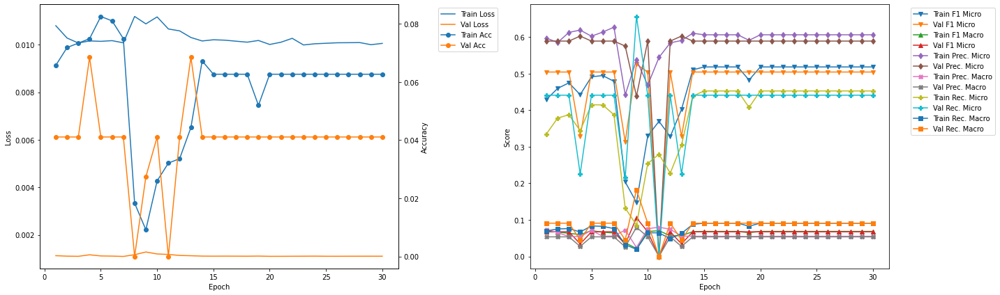

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 27.95
Train Loss: 0.0105 	Validation Loss: 0.0012
Train Accuracy: 0.0459 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.3875 	Validation F1 Micro: 0.3504
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.5393 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0696 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.3024 	Validation Recall Micro: 0.2388
Train Recall Marco: 0.0632 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.11
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4407 	Validation F1 Micro: 0.5014
Train F1 Marco: 0.0696 	Validation F1 Macro: 0.0677
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0746 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.34

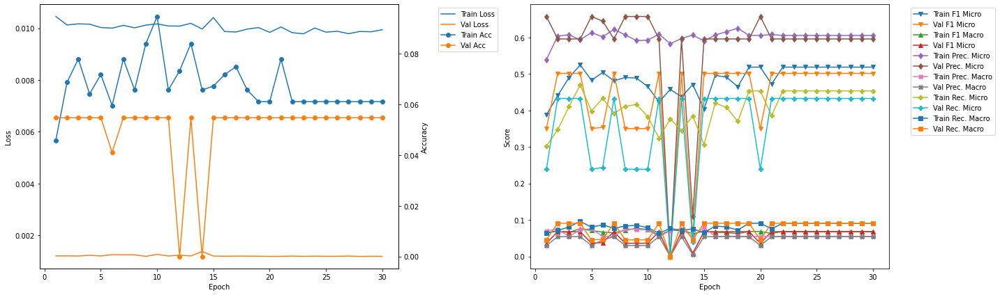

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.58
Train Loss: 0.011 	Validation Loss: 0.0012
Train Accuracy: 0.0458 	Validation Accuracy: 0.0
Train F1 Mirco: 0.3871 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0667 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5405 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0716 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.3015 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0637 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.74
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.087 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4593 	Validation F1 Micro: 0.31
Train F1 Marco: 0.0686 	Validation F1 Macro: 0.0335
Train Precision Mirco: 0.6194 	Validation Precision Micro: 0.5833
Train Precision Marco: 0.0736 	Validation Precision Macro: 0.0265
Train Recall Mirco: 0.365 	Validation Recall Micr

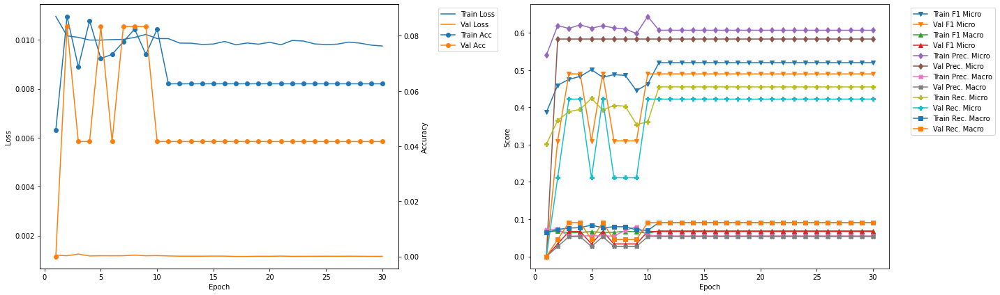

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.22
Train Loss: 0.0106 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.3652 	Validation F1 Micro: 0.4088
Train F1 Marco: 0.0548 	Validation F1 Macro: 0.0398
Train Precision Mirco: 0.5885 	Validation Precision Micro: 0.7778
Train Precision Marco: 0.0563 	Validation Precision Macro: 0.0354
Train Recall Mirco: 0.2648 	Validation Recall Micro: 0.2772
Train Recall Marco: 0.0536 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.37
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0763 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4826 	Validation F1 Micro: 0.4088
Train F1 Marco: 0.0649 	Validation F1 Macro: 0.0398
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.7778
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0354
Train Recall Mirco: 0.398

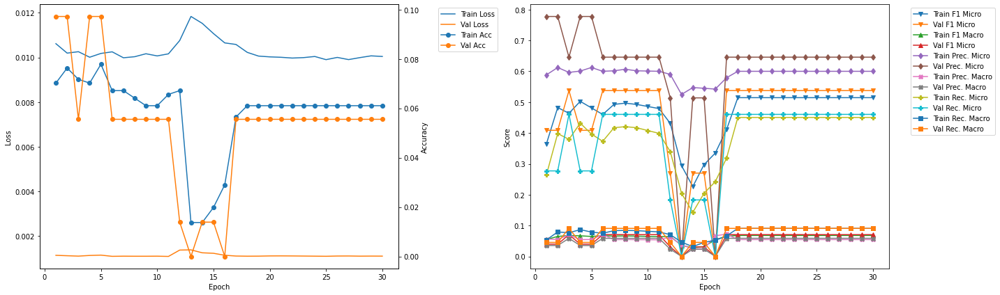

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 41.86
Train Loss: 0.0108 	Validation Loss: 0.0011
Train Accuracy: 0.0366 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4087 	Validation F1 Micro: 0.546
Train F1 Marco: 0.0726 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.5507 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.082 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.325 	Validation Recall Micro: 0.4767
Train Recall Marco: 0.0717 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.01
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5036 	Validation F1 Micro: 0.546
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0708
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4327 

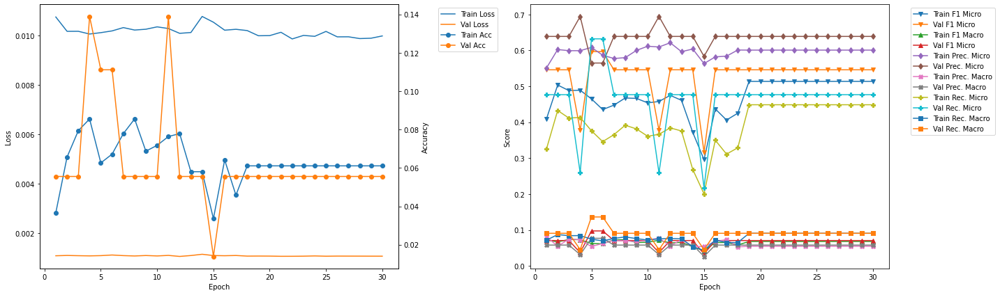

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 5
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.465 	Validation F1 Micro: 0.5966
Train F1 Marco: 0.0624 	Validation F1 Macro: 0.0975
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.5648
Train Precision Marco: 0.054 	Validation Precision Macro: 0.077
Train Recall Mirco: 0.3763 	Validation Recall Micro: 0.6321
Train Recall Marco: 0.0745 	Validation Recall Macro: 0.1364


In [24]:
densenet169LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet169LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0201 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0911 	Validation F1 Micro: 0.0
Train F1 Marco: 0.06 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1672 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1257 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0626 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0576 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.33
Train Loss: 0.0134 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

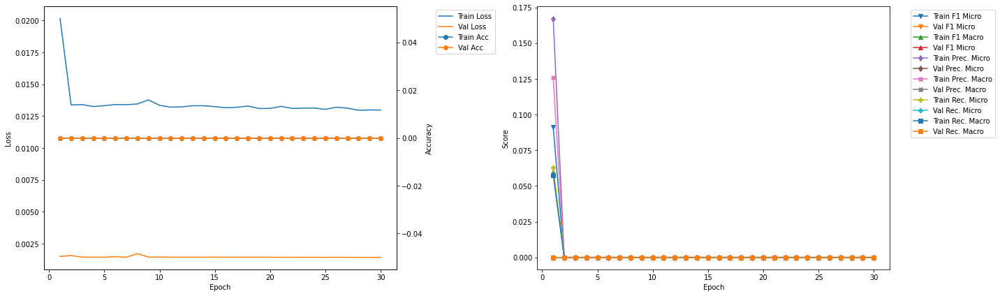

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.08
Train Loss: 0.0143 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.25
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

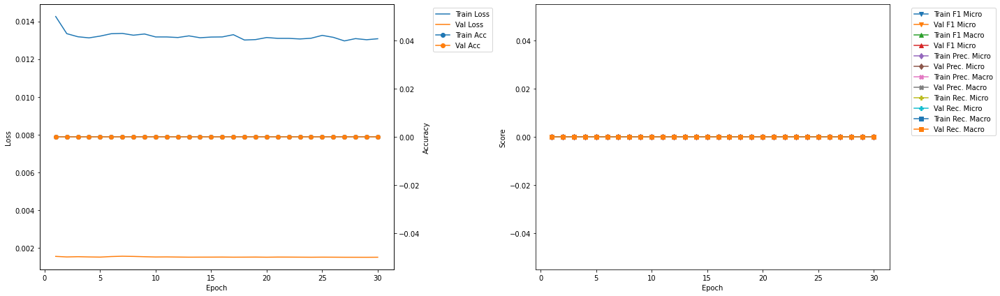

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.0
Train Loss: 0.0142 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.17
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall 

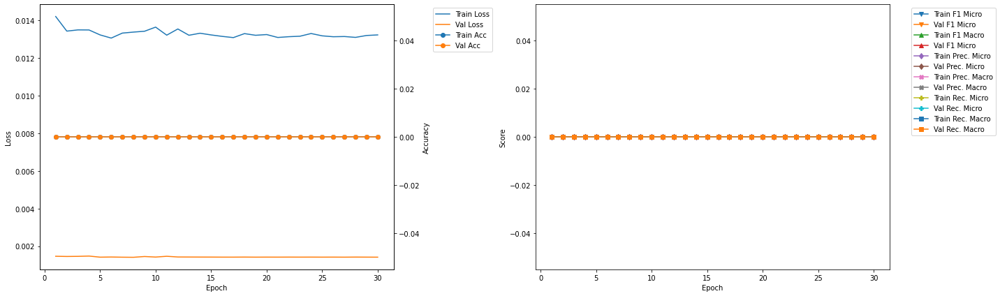

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.93
Train Loss: 0.014 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.09
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall 

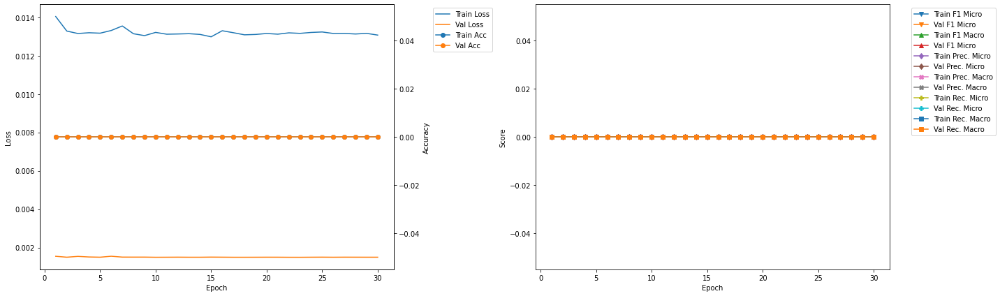

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.85
Train Loss: 0.0157 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0561 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0339 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.15 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1091 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0345 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0329 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 20.01
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

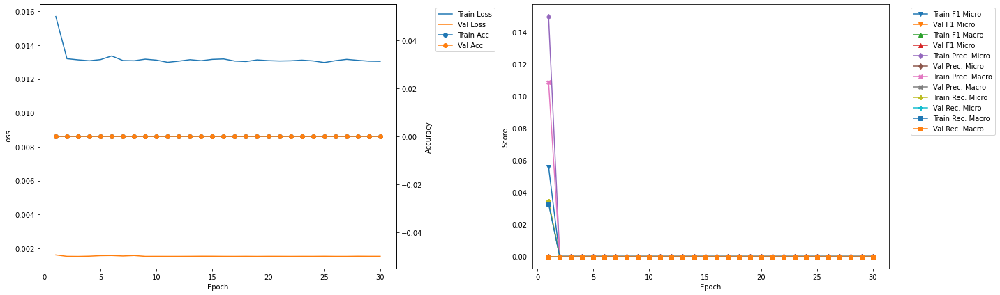

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.77
Train Loss: 0.0156 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0575 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0348 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.155 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1127 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0353 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0281 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.94
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

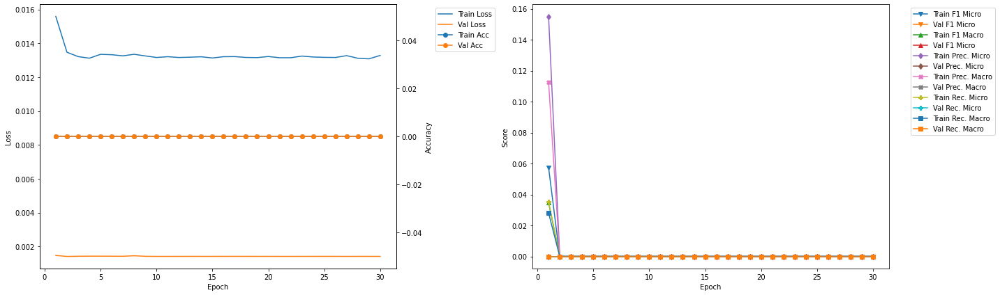

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.69
Train Loss: 0.0158 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0604 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0423 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1625 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1182 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0371 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0334 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.85
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 

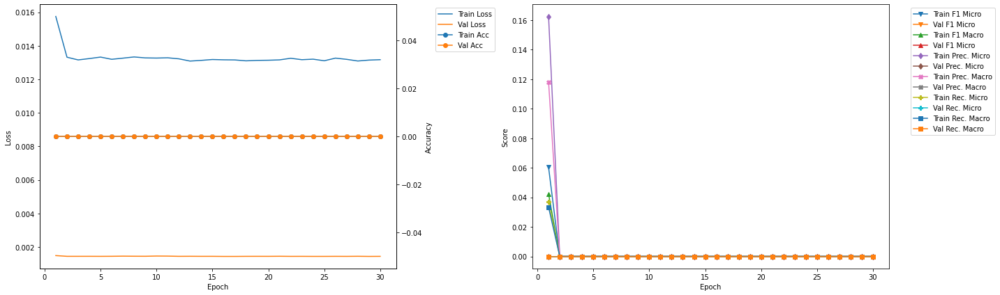

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.67
Train Loss: 0.0155 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0488 	Validation F1 Micro: 0.0
Train F1 Marco: 0.026 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1457 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0927 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0293 	Validation Recall Micro: 0.0
Train Recall Marco: 0.017 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.84
Train Loss: 0.0132 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

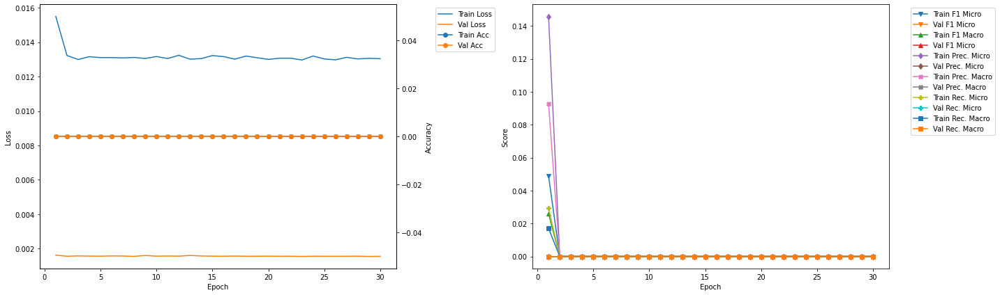

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.59
Train Loss: 0.0141 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.75
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

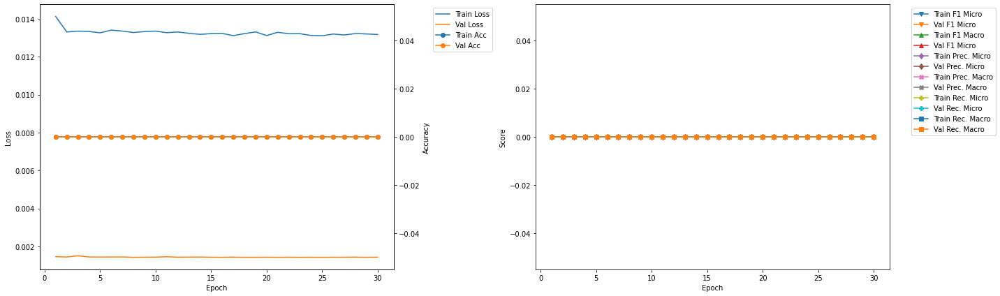

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.51
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.67
Train Loss: 0.0131 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recal

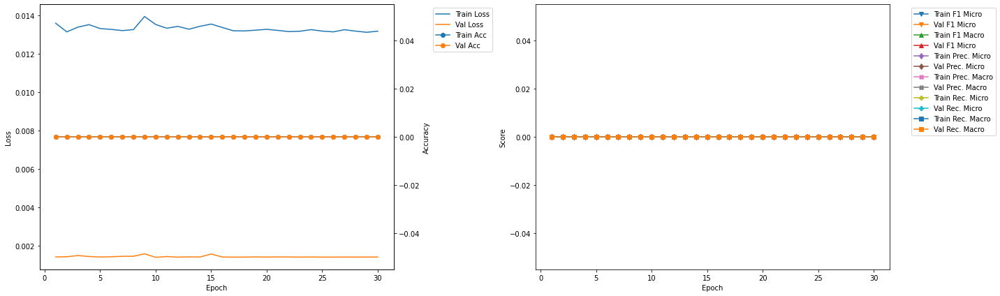

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 0 	Epoch: 0
Train Loss: 0 	Validation Loss: 0
Train Accuracy: 0 	Validation Accuracy: 0
Train F1 Mirco: 0 	Validation F1 Micro: 0
Train F1 Marco: 0 	Validation F1 Macro: 0
Train Precision Mirco: 0 	Validation Precision Micro: 0
Train Precision Marco: 0 	Validation Precision Macro: 0
Train Recall Mirco: 0 	Validation Recall Micro: 0
Train Recall Marco: 0 	Validation Recall Macro: 0


In [25]:
densenet201LSTM_700_1_50_best = Kfold_train_CNN_RNN(model = densenet201LSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0169 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.083 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0589 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.119 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1156 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0637 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0708 	Validation Recall Macro: 0.0

Validation F1 Micro Score Increased (0.000000 --> 0.314176).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.4
Train Loss: 0.0114 	Validation Loss: 0.0011
Train Accuracy: 0.0214 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.2216 	Validation F1 Micro: 0.3142
Train F1 Marco: 0.0365 	Validation F1 Macro: 0.0327
Train Precision Mirco: 0.5694 	Validation Precision Micro: 0.5616
Train Precision Marco: 0.0544 	Valid

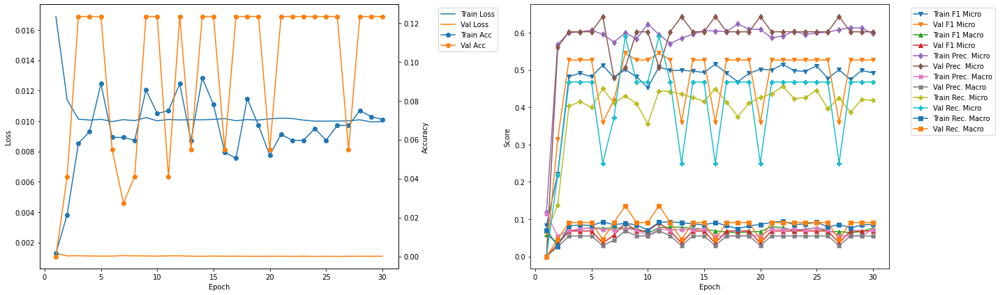

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.92
Train Loss: 0.0115 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4058 	Validation F1 Micro: 0.4788
Train F1 Marco: 0.057 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.5863 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0537 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.3103 	Validation Recall Micro: 0.4293
Train Recall Marco: 0.061 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.1
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.521 	Validation F1 Micro: 0.4788
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.6116 	Validation Precision Micro: 0.5411
Train Precision Marco: 0.0556 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4538 	Va

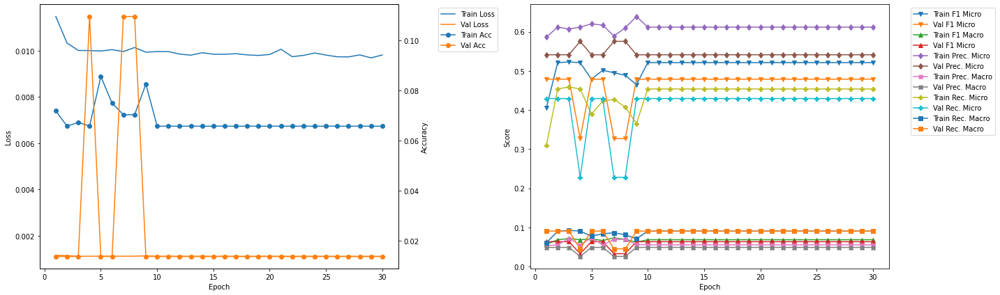

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.545455 --> 0.595000).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 11.6
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.479 	Validation F1 Micro: 0.595
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.0939
Train Precision Mirco: 0.5899 	Validation Precision Micro: 0.5434
Train Precision Marco: 0.1138 	Validation Precision Macro: 0.0741
Train Recall Mirco: 0.4032 	Validation Recall Micro: 0.6575
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.1364

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.79
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0703 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5042 	Validation F1 Micro: 0.5627
Train F1 Marco: 0.0728 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.5925 	Validation Precision Micro: 0.6301
Train Precision

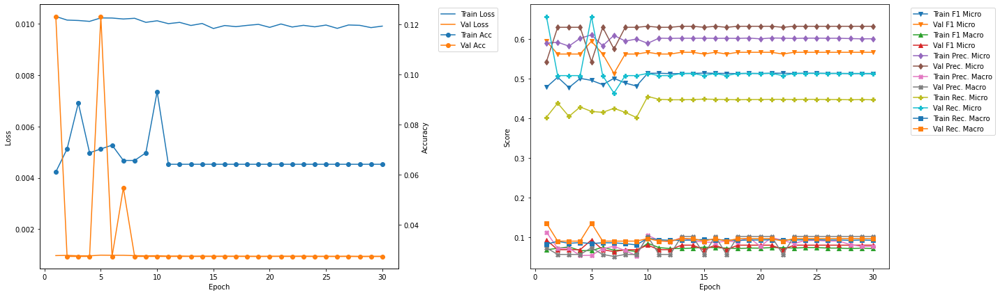

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.25
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.078 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5148 	Validation F1 Micro: 0.4804
Train F1 Marco: 0.0785 	Validation F1 Macro: 0.0768
Train Precision Mirco: 0.5985 	Validation Precision Micro: 0.585
Train Precision Marco: 0.1198 	Validation Precision Macro: 0.0984
Train Recall Mirco: 0.4516 	Validation Recall Micro: 0.4076
Train Recall Marco: 0.0925 	Validation Recall Macro: 0.0966

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.44
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0826 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4868 	Validation F1 Micro: 0.3368
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0457
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.6486
Train Precision Marco: 0.0854 	Validation Precision Macro: 0.0747
Train Recall Mirco: 0.4021

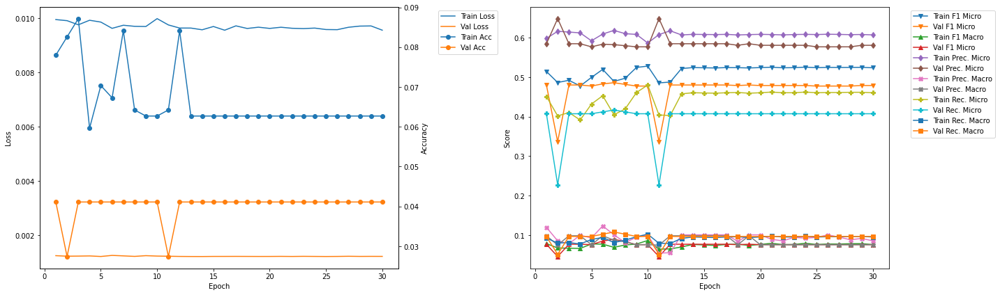

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 22.9
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4866 	Validation F1 Micro: 0.5364
Train F1 Marco: 0.0734 	Validation F1 Macro: 0.0811
Train Precision Mirco: 0.6096 	Validation Precision Micro: 0.6259
Train Precision Marco: 0.1111 	Validation Precision Macro: 0.1021
Train Recall Mirco: 0.4049 	Validation Recall Micro: 0.4694
Train Recall Marco: 0.0836 	Validation Recall Macro: 0.0974

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.09
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5173 	Validation F1 Micro: 0.5364
Train F1 Marco: 0.0753 	Validation F1 Macro: 0.0811
Train Precision Mirco: 0.602 	Validation Precision Micro: 0.6259
Train Precision Marco: 0.0796 	Validation Precision Macro: 0.1021
Train Recall Mirco: 0.4535 	V

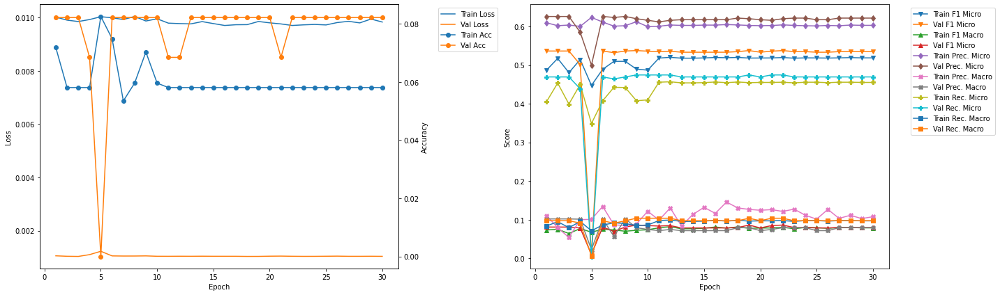

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.55
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4822 	Validation F1 Micro: 0.5202
Train F1 Marco: 0.0793 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6087 	Validation Precision Micro: 0.6207
Train Precision Marco: 0.1616 	Validation Precision Macro: 0.0564
Train Recall Mirco: 0.3992 	Validation Recall Micro: 0.4478
Train Recall Marco: 0.0855 	Validation Recall Macro: 0.0899

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.74
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0535 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5076 	Validation F1 Micro: 0.5245
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.5989 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0773 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4404

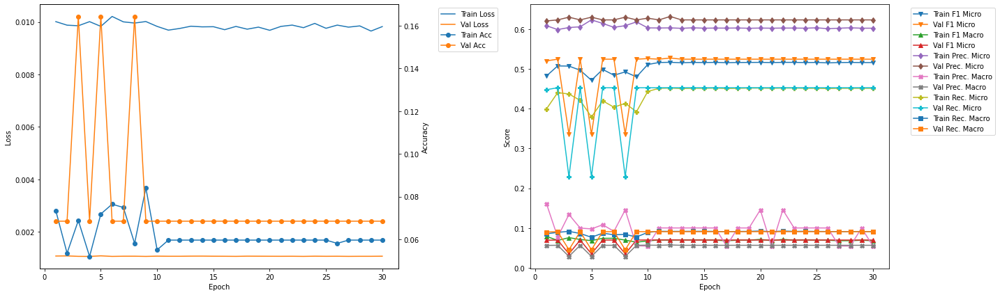

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.2
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0749 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4757 	Validation F1 Micro: 0.5621
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.1459 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.388 	Validation Recall Micro: 0.4948
Train Recall Marco: 0.0788 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.38
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.523 	Validation F1 Micro: 0.5621
Train F1 Marco: 0.0811 	Validation F1 Macro: 0.071
Train Precision Mirco: 0.5816 	Validation Precision Micro: 0.6507
Train Precision Marco: 0.1178 	Validation Precision Macro: 0.0592
Train Recall Mirco: 0.4752 	Validat

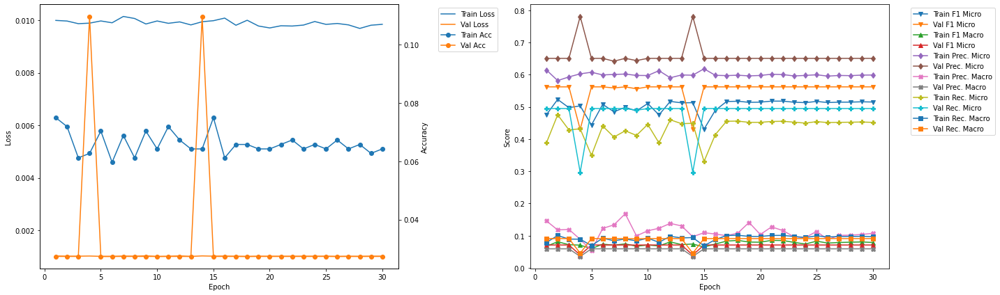

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 39.85
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0595 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5106 	Validation F1 Micro: 0.526
Train F1 Marco: 0.0776 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.589
Train Precision Marco: 0.1162 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4439 	Validation Recall Micro: 0.4751
Train Recall Marco: 0.0944 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.04
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0687 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4909 	Validation F1 Micro: 0.526
Train F1 Marco: 0.075 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.5892 	Validation Precision Micro: 0.589
Train Precision Marco: 0.1152 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4207 	Valid

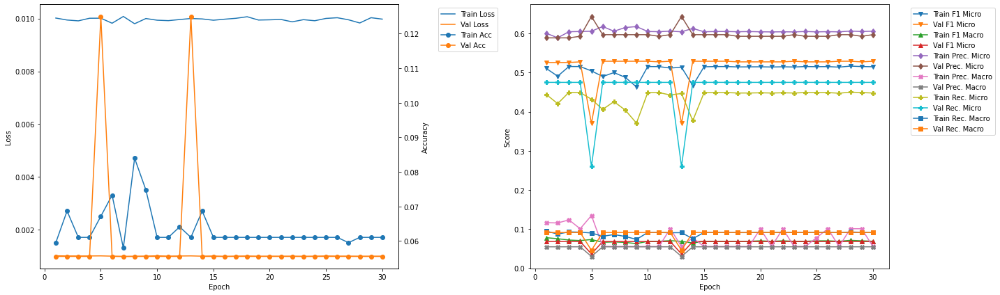

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.5
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.4857
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0671
Train Precision Mirco: 0.6076 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.07 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4233 	Validation Recall Micro: 0.4126
Train Recall Marco: 0.0843 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.68
Train Loss: 0.0097 	Validation Loss: 0.0013
Train Accuracy: 0.0611 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.5205 	Validation F1 Micro: 0.4857
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0671
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4561 	

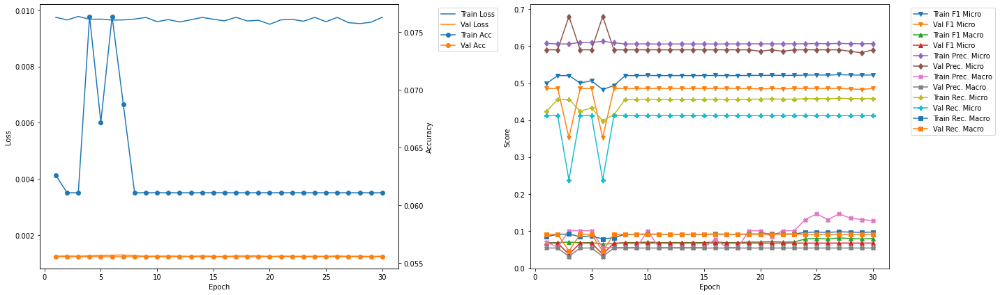

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.14
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0733 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4837 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6287 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.1469 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3931 	Validation Recall Micro: 0.4203
Train Recall Marco: 0.0786 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.33
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0687 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4805 	Validation F1 Micro: 0.4957
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6166 	Validation Precision Micro: 0.6042
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0549
Train Recall Mirco: 0.3

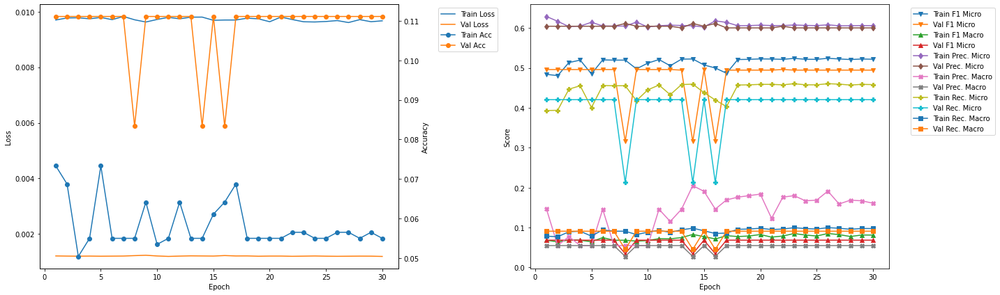

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 1
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.479 	Validation F1 Micro: 0.595
Train F1 Marco: 0.0691 	Validation F1 Macro: 0.0939
Train Precision Mirco: 0.5899 	Validation Precision Micro: 0.5434
Train Precision Marco: 0.1138 	Validation Precision Macro: 0.0741
Train Recall Mirco: 0.4032 	Validation Recall Micro: 0.6575
Train Recall Marco: 0.0832 	Validation Recall Macro: 0.1364


In [26]:
vgg11bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.2
Train Loss: 0.0177 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1327 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0721 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1702 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1196 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.1088 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0776 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.41
Train Loss: 0.0139 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

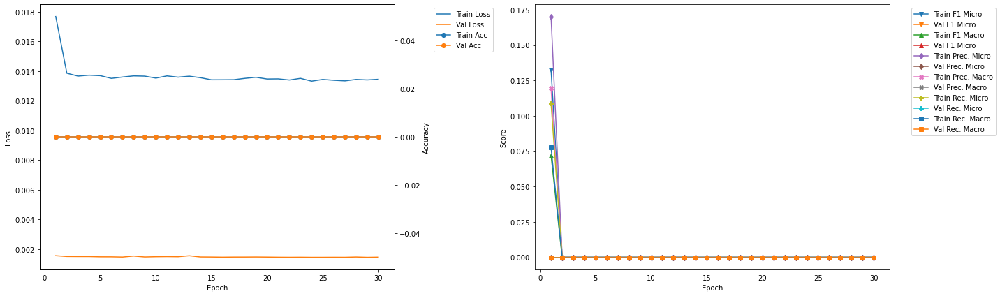

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.25
Train Loss: 0.0144 	Validation Loss: 0.0017
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.45
Train Loss: 0.0136 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

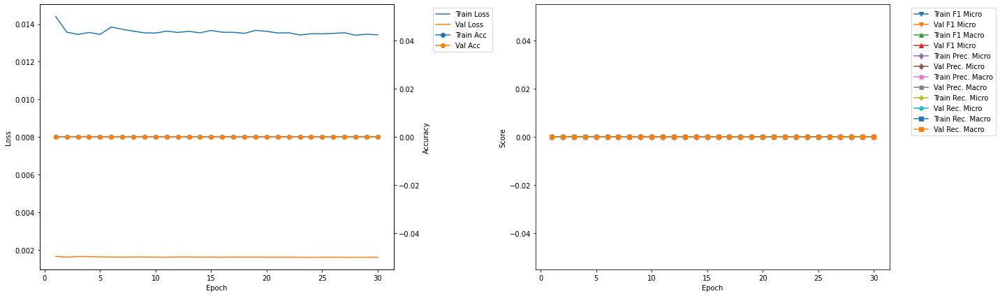

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.29
Train Loss: 0.0143 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.5
Train Loss: 0.0135 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall 

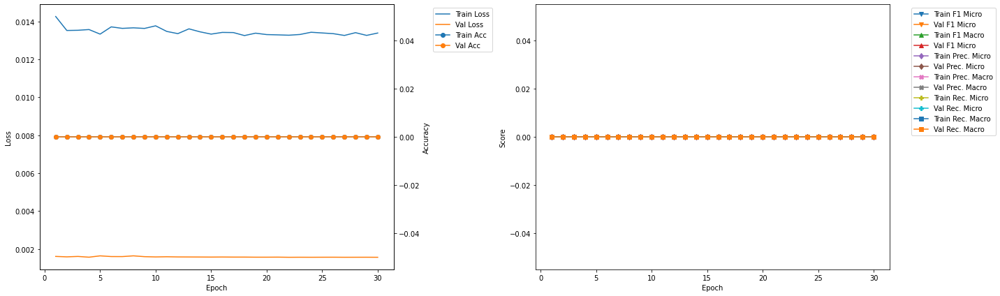

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.34
Train Loss: 0.0164 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0619 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0448 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1435 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1255 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0395 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0469 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.54
Train Loss: 0.0138 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 

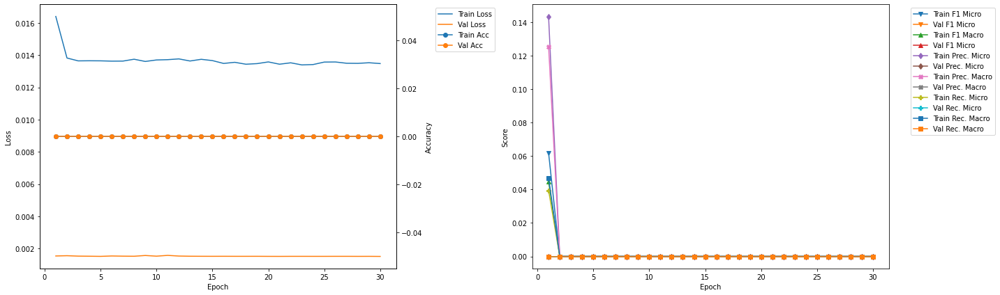

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.39
Train Loss: 0.0155 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0614 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0455 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.145 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1242 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0389 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0489 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.59
Train Loss: 0.0137 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

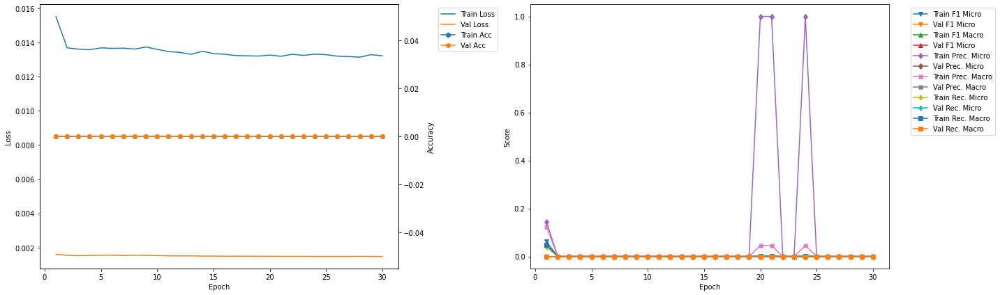

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.44
Train Loss: 0.0142 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.64
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

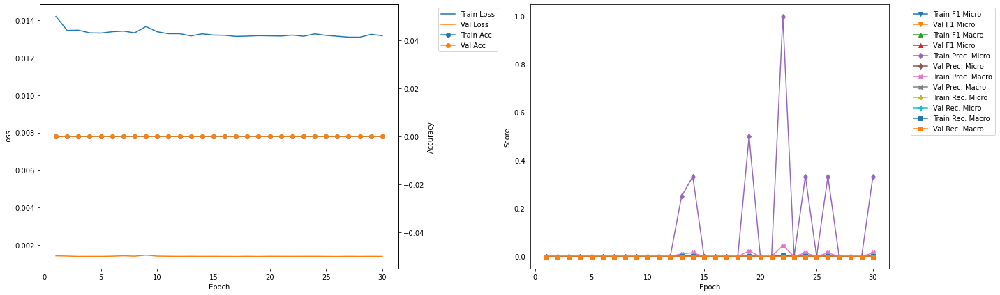

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.5
Train Loss: 0.0142 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0031 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.15 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0068 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall Marco: 0.002 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 36.7
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0016 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1429 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0909 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall M

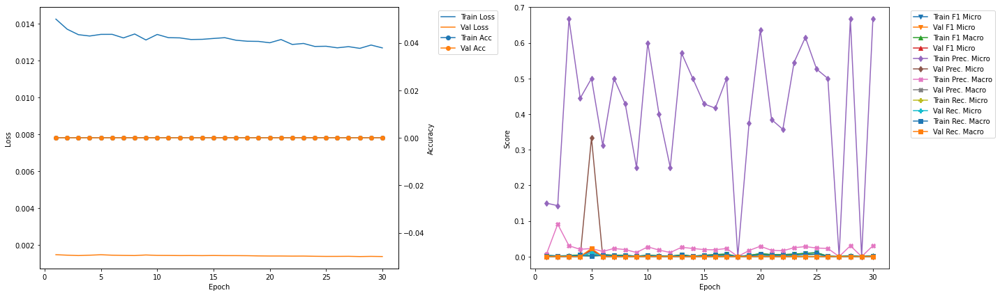

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.56
Train Loss: 0.0139 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0067 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0072 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1538 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0195 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0034 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0044 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.77
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0068 	Validation F1 Micro: 0.0203
Train F1 Marco: 0.0074 	Validation F1 Macro: 0.014
Train Precision Mirco: 0.4615 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0303
Train Recall Mirco: 0.0034 	Validation Recall Micro: 0.

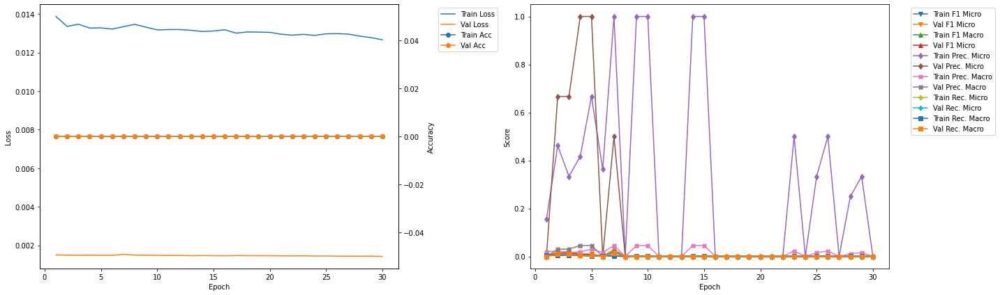

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 48.64
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0013 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 48.84
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0013 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Ma

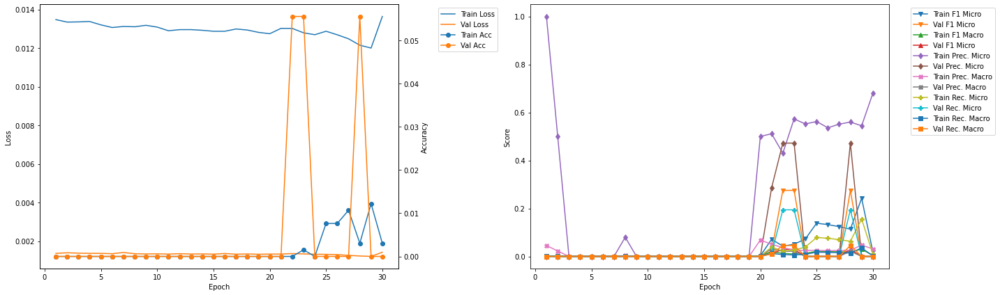

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 54.72
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0013 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 54.92
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0013 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall M

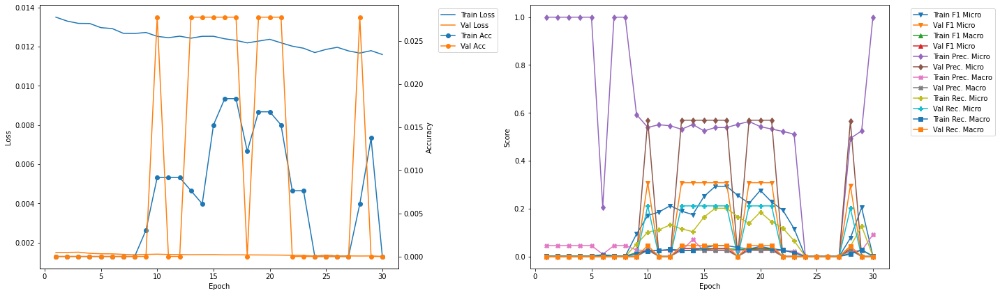

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 10
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0092 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.1709 	Validation F1 Micro: 0.3083
Train F1 Marco: 0.0237 	Validation F1 Macro: 0.033
Train Precision Mirco: 0.5394 	Validation Precision Micro: 0.5694
Train Precision Marco: 0.0245 	Validation Precision Macro: 0.0259
Train Recall Mirco: 0.1015 	Validation Recall Micro: 0.2113
Train Recall Marco: 0.0229 	Validation Recall Macro: 0.0455


In [27]:
vgg16bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_700_1_50')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0185 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0736 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0405 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1223 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1349 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0526 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0341 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

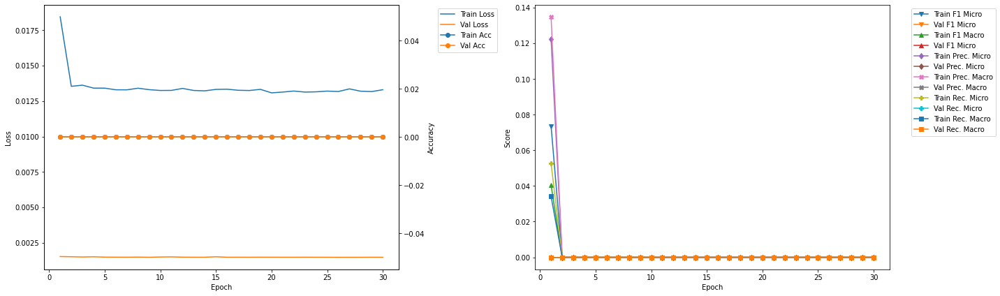

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.49
Train Loss: 0.0142 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.69
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

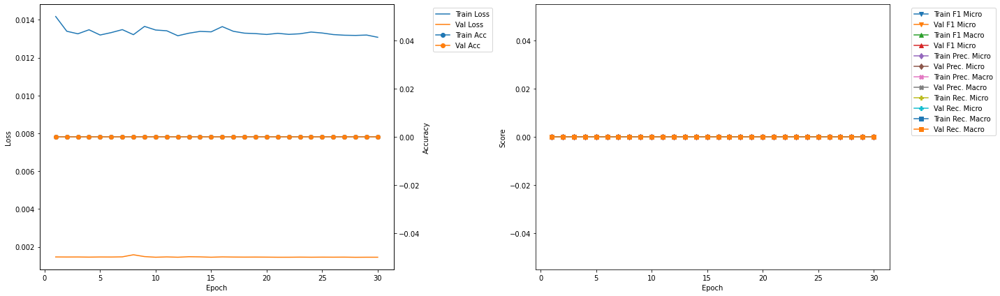

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.76
Train Loss: 0.0136 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.97
Train Loss: 0.0131 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

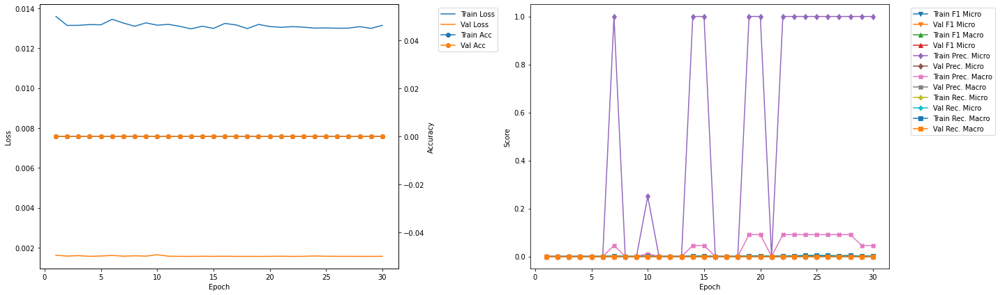

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.000000 --> 0.010417).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 19.05
Train Loss: 0.0135 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0104
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0076
Train Precision Mirco: 0.0 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0052
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0041

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.25
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0104
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0076
Train Precision Mirco: 0.0 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0 	Validation Precision Macro:

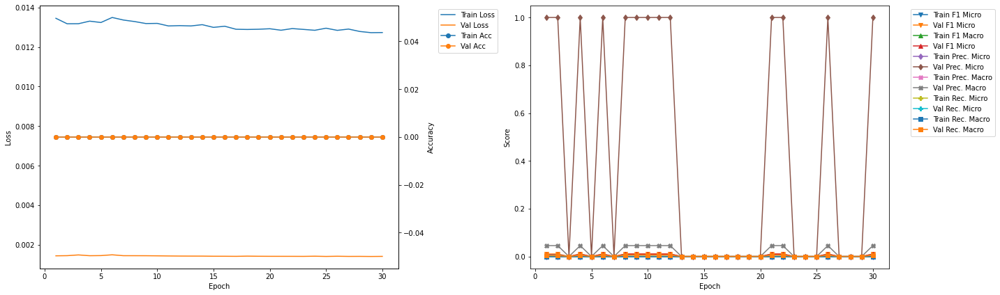

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.31
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.52
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0013 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Va

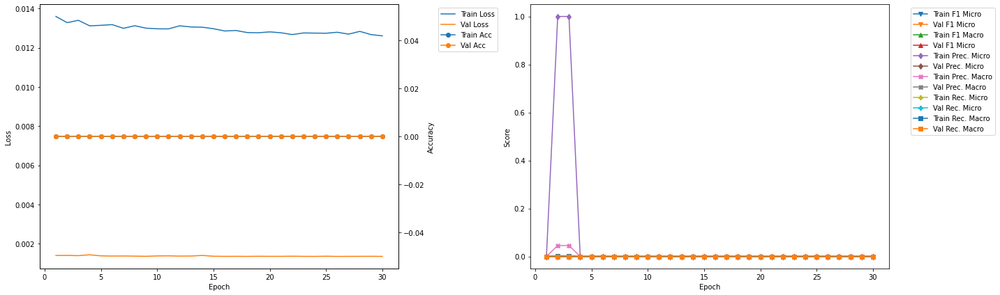

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.58
Train Loss: 0.0145 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0336 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0255 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1236 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0618 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0194 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0394 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.79
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

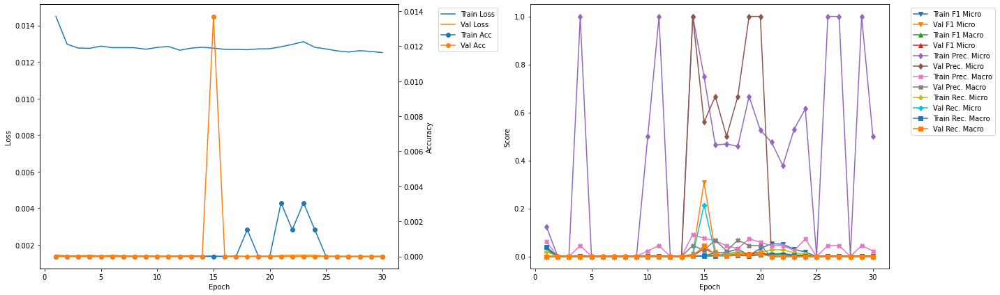

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.89
Train Loss: 0.014 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0912 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0317 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.3032 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0978 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0537 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0379 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.09
Train Loss: 0.0128 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0027 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.6667 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0303 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Reca

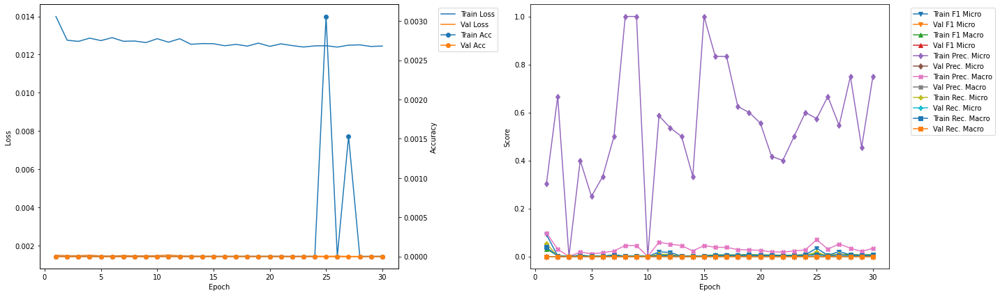

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.16
Train Loss: 0.0138 	Validation Loss: 0.0014
Train Accuracy: 0.0046 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1022 	Validation F1 Micro: 0.0106
Train F1 Marco: 0.0274 	Validation F1 Macro: 0.0083
Train Precision Mirco: 0.3376 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0572 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0602 	Validation Recall Micro: 0.0053
Train Recall Marco: 0.0192 	Validation Recall Macro: 0.0045

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.36
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0068 	Validation F1 Micro: 0.0106
Train F1 Marco: 0.0057 	Validation F1 Macro: 0.0083
Train Precision Mirco: 0.5455 	Validation Precision Micro: 1.0
Train Precision Marco: 0.053 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0034 	Validatio

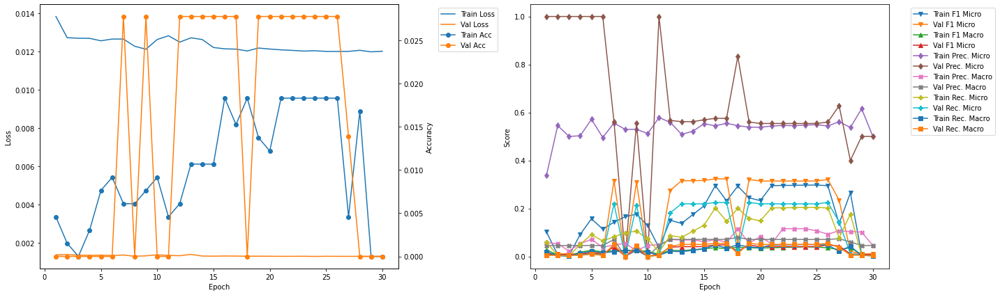

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.55
Train Loss: 0.0132 	Validation Loss: 0.0013
Train Accuracy: 0.0092 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1575 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0363 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.4769 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0847 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0943 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0291 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.76
Train Loss: 0.0117 	Validation Loss: 0.0013
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1145 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0266 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5385 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1525 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.064 	Validation Recall Micro: 0.0
Trai

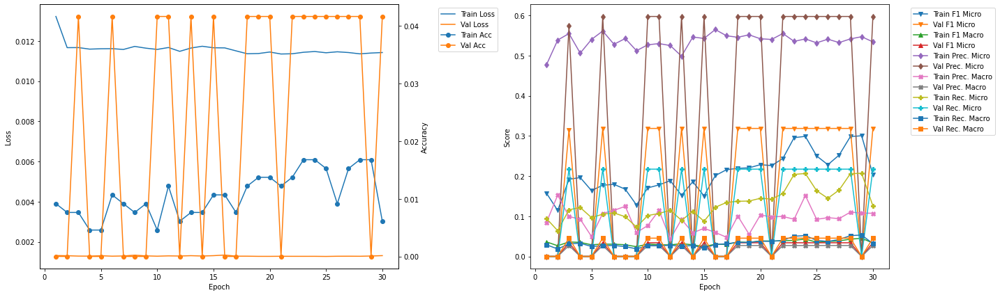

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 56.82
Train Loss: 0.012 	Validation Loss: 0.0013
Train Accuracy: 0.0092 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.2103 	Validation F1 Micro: 0.1495
Train F1 Marco: 0.0415 	Validation F1 Macro: 0.0353
Train Precision Mirco: 0.5616 	Validation Precision Micro: 0.5517
Train Precision Marco: 0.1162 	Validation Precision Macro: 0.0707
Train Recall Mirco: 0.1294 	Validation Recall Micro: 0.0865
Train Recall Marco: 0.0344 	Validation Recall Macro: 0.0276

Epoch 2 	Learning Rate: 0.01 	Time (min): 57.03
Train Loss: 0.0116 	Validation Loss: 0.0013
Train Accuracy: 0.0168 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.2387 	Validation F1 Micro: 0.2713
Train F1 Marco: 0.0336 	Validation F1 Macro: 0.0424
Train Precision Mirco: 0.5467 	Validation Precision Micro: 0.4795
Train Precision Marco: 0.0611 	Validation Precision Macro: 0.0672
Train Recall Mirco: 0.15

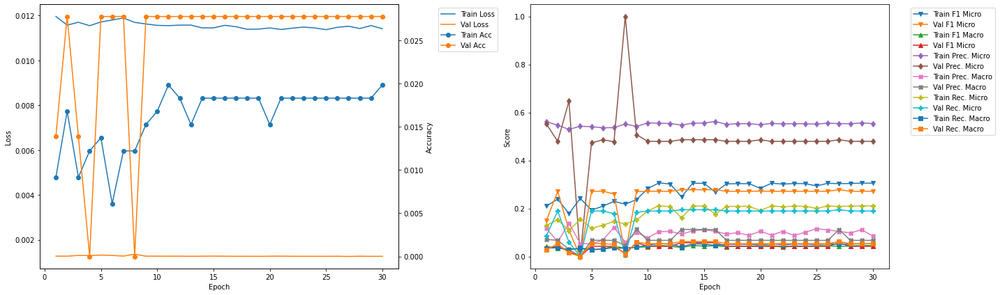

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 16
Train Loss: 0.0121 	Validation Loss: 0.0013
Train Accuracy: 0.0183 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.2949 	Validation F1 Micro: 0.3231
Train F1 Marco: 0.0361 	Validation F1 Macro: 0.0479
Train Precision Mirco: 0.5443 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0701 	Validation Precision Macro: 0.0711
Train Recall Mirco: 0.2023 	Validation Recall Micro: 0.2246
Train Recall Marco: 0.0475 	Validation Recall Macro: 0.0545


In [28]:
vgg19bnLSTM_700_1_50_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_700_1_50, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_700_1_50')

In [29]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:27:18


## Training Summary

### Summary Table

In [30]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_700_1_50_best,
    'ResNet50' : resnet50LSTM_700_1_50_best,
    'ResNet101' : resnet101LSTM_700_1_50_best,
    'DenseNet121' : densenet121LSTM_700_1_50_best,
    'DenseNet169' : densenet169LSTM_700_1_50_best,
    'DenseNet201' : densenet201LSTM_700_1_50_best,
    'VGG11_BN' : vgg11bnLSTM_700_1_50_best,
    'VGG16_BN' : vgg16bnLSTM_700_1_50_best,
    'VGG19_BN' : vgg19bnLSTM_700_1_50_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,9.000000,8.000000,7.000000,2.000000,10.000000,0,3.000000,10.000000,8.000000
Epoch,1.000000,5.000000,1.000000,6.000000,5.000000,0,1.000000,10.000000,16.000000
Train Loss,0.010267,0.010126,0.010209,0.010153,0.010121,0,0.010286,0.012529,0.012135
Train Accuracy,0.061069,0.076336,0.055046,0.064220,0.062595,0,0.061162,0.009160,0.018321
Train F1 Micro,0.500824,0.457711,0.498674,0.475821,0.464952,0,0.478977,0.170907,0.294946
Train F1 Macro,0.068234,0.061522,0.066508,0.064372,0.062437,0,0.069098,0.023692,0.036127
Train Precision Micro,0.591440,0.607547,0.597774,0.606115,0.608295,0,0.589892,0.539394,0.544343
Train Precision Macro,0.056360,0.053773,0.054084,0.088045,0.053972,0,0.113750,0.024518,0.070102
Train Recall Micro,0.434286,0.367161,0.427759,0.391633,0.376283,0,0.403171,0.101540,0.202273
Train Recall Macro,0.088502,0.072676,0.086611,0.077240,0.074509,0,0.083157,0.022920,0.047526


### Training Summary Graph

In [31]:
import plotly
import plotly.graph_objects as go

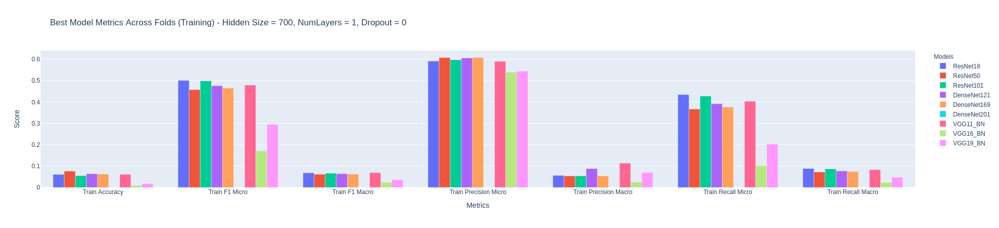

In [32]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 700, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

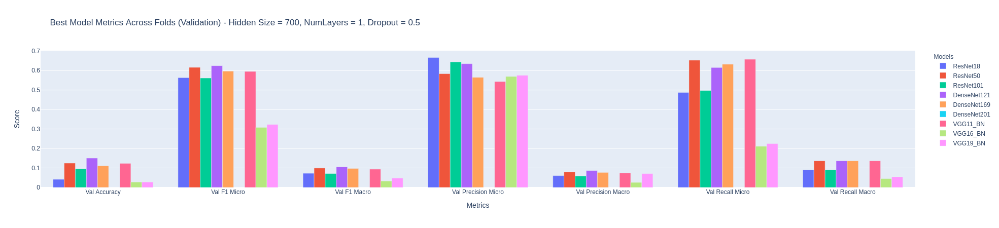

In [33]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 700, NumLayers = 1, Dropout = 0.5',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()